# Analyses of the inferred embeddings of the structural regualtors

In this notebook we assess the inferred image embeddings for the previosuly determined structural embeddings. To this end, we will use the embeddings computed during the training of the ResNet ensemble in the 4-fold Group CV setup.

---

## 0. Environmental setup

First, we read in the required software packages and libraries.

In [1]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from umap import UMAP
from sklearn.preprocessing import StandardScaler
from sklearn.manifold import TSNE
import seaborn as sns
from tqdm import tqdm
import sys

sys.path.append("../../..")
from src.utils.notebooks.ppi.embedding import *

%load_ext nb_black

<IPython.core.display.Javascript object>

In [2]:
def plot_embs(latents, random_state=1234, normalize_all=True):
    color_dict = {
        "fold_0": "tab:blue",
        "fold_1": "tab:green",
        "fold_2": "tab:red",
        "fold_3": "tab:orange",
    }
    tmp = latents.copy()
    latents = tmp.loc[:, ~latents.columns.isin(["labels", "fold"])]
    labels = tmp.loc[:, "labels"]
    types = tmp.loc[:, "fold"]

    if normalize_all:
        zs = StandardScaler().fit_transform(latents)
    else:
        for t in np.unique(types):
            latents_fold = latents.loc[types == t]
            ctrl_latents_fold = latents_fold.loc[labels == "EMPTY"]
            latents.loc[types == t] = StandardScaler().fit_transform(
                latents.loc[types == t]
            )

        zs = np.array(latents)

    embs = UMAP(random_state=random_state).fit_transform(zs)

    for target in tqdm(np.unique(labels)):
        fig, ax = plt.subplots(figsize=[12, 8])
        for t in set(types):
            e = embs[types == t, :]
            l = labels[types == t]
            ax.scatter(
                e[l == target, 0],
                e[l == target, 1],
                c=color_dict[t],
                alpha=0.8,
                label="{}_{}".format(t.upper(), target.upper()),
                s=2,
            )
        ax.scatter(
            embs[labels != target, 0],
            embs[labels != target, 1],
            c="tab:gray",
            alpha=0.02,
            label="REST",
            s=2,
        )
        ax.set_xlabel("umap_0")
        ax.set_ylabel("umap_1")
        ax.set_title("Embeddings for {} vs REST".format(target.upper()))
        plt.legend()
        plt.show()
        plt.close()
    return embs

<IPython.core.display.Javascript object>

Second, we read in the data that describes the latent embeddings of the individual images part of the respective held-out sets in the CV setting.

In [4]:
root_dir = (
    "../../../data/experiments/image_embeddings/specificity_target_emb_cv/final_2048/"
)

all_latents = []

for i in range(4):
    latents = pd.read_hdf(root_dir + "fold_{}/".format(i) + "test_latents.h5")
    latents["fold"] = "fold_{}".format(i)
    all_latents.append(latents)
latents = pd.concat(all_latents)
print("Read in latent embeddings of shape: {}".format(np.array(latents).shape))

Read in latent embeddings of shape: (179925, 2050)


<IPython.core.display.Javascript object>

We will decode the numeric class labels to identify which regulator each embedding corresponds to.

In [5]:
label_dict = {
    "AKT1S1": 0,
    "APC": 1,
    "ATF4": 2,
    "BAX": 3,
    "BCL2L11": 4,
    "BRAF": 5,
    "CASP8": 6,
    "CDC42": 7,
    "CDKN1A": 8,
    "CEBPA": 9,
    "CREB1": 10,
    "CSNK1E": 11,
    "CXXC4": 12,
    "DIABLO": 13,
    "E2F1": 14,
    "ELK1": 15,
    "EMPTY": 16,
    "ERG": 17,
    "FGFR3": 18,
    "FOXO1": 19,
    "GLI1": 20,
    "HRAS": 21,
    "IRAK4": 22,
    "JUN": 23,
    "KRAS": 24,
    "MAP2K3": 25,
    "MAP3K2": 26,
    "MAP3K5": 27,
    "MAP3K9": 28,
    "MAPK7": 29,
    "MOS": 30,
    "MYD88": 31,
    "PIK3R2": 32,
    "PKIA": 33,
    "PRKACA": 34,
    "PRKCE": 35,
    "RAF1": 36,
    "RELB": 37,
    "RHOA": 38,
    "SMAD3": 39,
    "SMAD4": 40,
    "SMO": 41,
    "SRC": 42,
    "SREBF1": 43,
    "TRAF2": 44,
    "TSC2": 45,
    "WWTR1": 46,
}
label_dict = dict(zip(list(label_dict.values()), list(label_dict.keys())))
latents.loc[:, "labels"] = latents.loc[:, "labels"].map(label_dict)

<IPython.core.display.Javascript object>

In [6]:
latents.head()

,zs_0,zs_1,zs_2,zs_3,zs_4,zs_5,zs_6,zs_7,zs_8,zs_9,...,zs_2040,zs_2041,zs_2042,zs_2043,zs_2044,zs_2045,zs_2046,zs_2047,labels,fold
taoe005-u2os-72h-cp-a-au00044858_l14_s1_w19dd5bdfc-6354-4977-85bb-d77aa18b0336_illum_corrected_10.tif,-0.042365,0.081327,0.104702,0.100128,-0.267581,0.479169,0.151164,0.280824,0.327684,-0.154291,...,-0.392751,0.064262,-0.573583,-0.118688,-0.309125,0.207993,-0.097535,0.174490,AKT1S1,fold_0
taoe005-u2os-72h-cp-a-au00044858_l16_s8_w15ff15608-7c60-46e5-96a9-c484285bc40c_illum_corrected_47.tif,-0.224196,-0.122437,0.232826,0.431987,-0.206852,0.464206,-0.019840,0.394103,0.446004,-0.412542,...,-0.309466,0.240112,-0.501231,-0.175365,-0.158294,0.052697,0.361119,-0.008016,AKT1S1,fold_0
taoe005-u2os-72h-cp-a-au00044858_l14_s6_w14ac387ff-d943-45fe-b196-95b5751b9b16_illum_corrected_51.tif,-0.172460,-0.019655,0.039818,0.379703,-0.469451,0.310500,0.013408,0.162117,0.239586,-0.264872,...,-0.435020,0.423704,-0.837818,-0.456296,-0.144030,0.031562,0.234817,-0.013405,AKT1S1,fold_0
taoe005-u2os-72h-cp-a-au00044858_l14_s2_w14c22c695-f505-4c16-853a-0956f26a58a7_illum_corrected_42.tif,-0.099343,0.067446,0.314616,0.284319,-0.112973,0.657999,0.132351,0.054773,0.307278,-0.329750,...,-0.348655,0.153528,-0.529026,-0.078314,-0.250498,-0.118122,-0.086548,0.085598,AKT1S1,fold_0
taoe005-u2os-72h-cp-a-au00044858_l14_s1_w19dd5bdfc-6354-4977-85bb-d77aa18b0336_illum_corrected_51.tif,-0.079060,0.056473,0.252477,0.365136,-0.434714,0.312334,0.488850,0.330741,0.324548,-0.411382,...,-0.549177,0.380161,-0.358725,-0.186180,0.046391,0.033784,-0.232942,0.114724,AKT1S1,fold_0


<IPython.core.display.Javascript object>

---

## 2. Visualization of the embeddings

Next, we will visualize the individual embeddings. To this end, we will use UMAP to compute a 2D representation of the individual embeddings.

As a first step we are interested in identifying on whether or not the embeddings cluster by folds. To this end, we will plot each individual regulator OE conditions vs all other conditions and color each data point by the fold where it was part of the held-out set.

### 2.1. Assessment of batch (fold) effects

  0%|          | 0/47 [00:00<?, ?it/s]

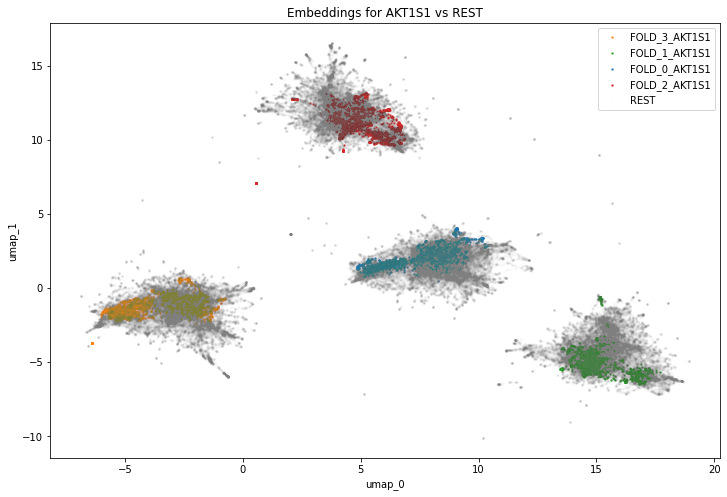

  2%|▏         | 1/47 [00:00<00:40,  1.13it/s]

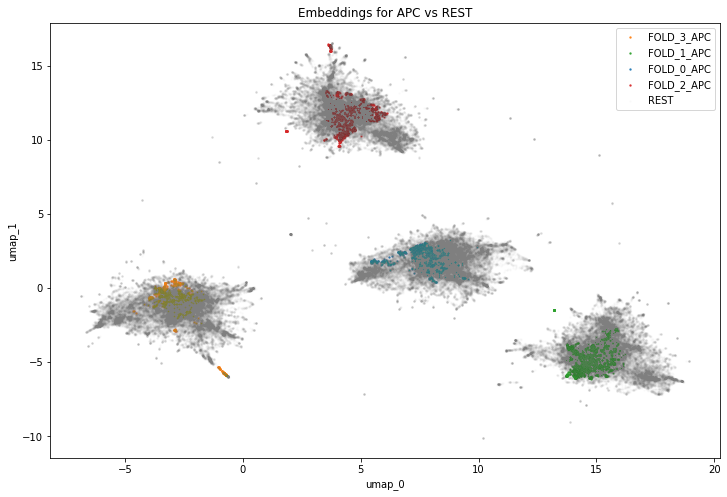

  4%|▍         | 2/47 [00:01<00:39,  1.13it/s]

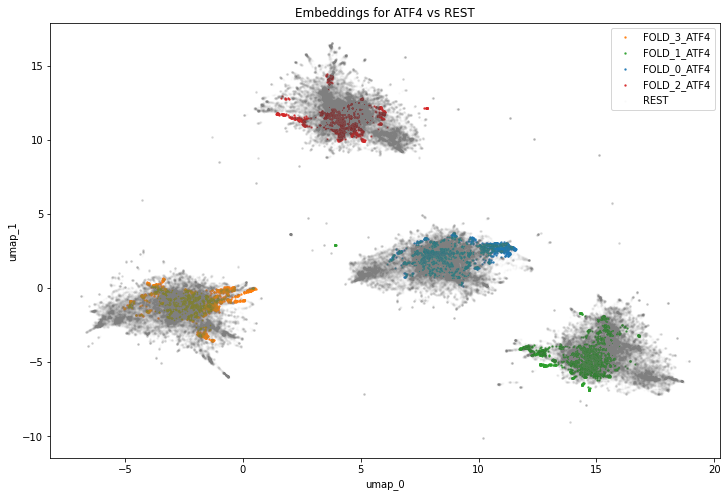

  6%|▋         | 3/47 [00:02<00:38,  1.13it/s]

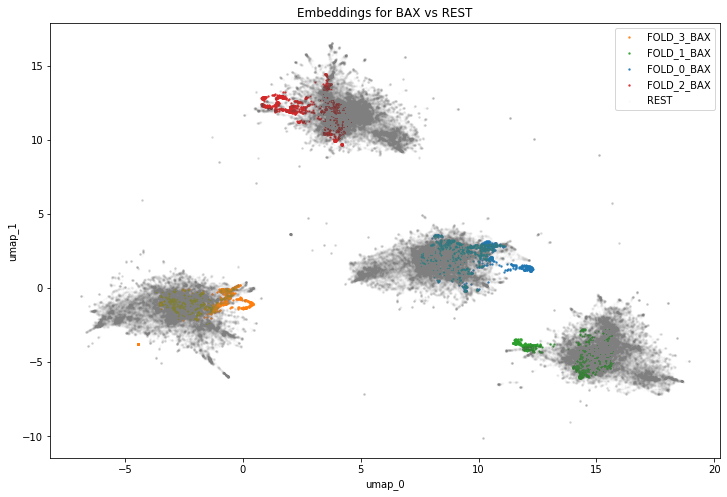

  9%|▊         | 4/47 [00:03<00:37,  1.14it/s]

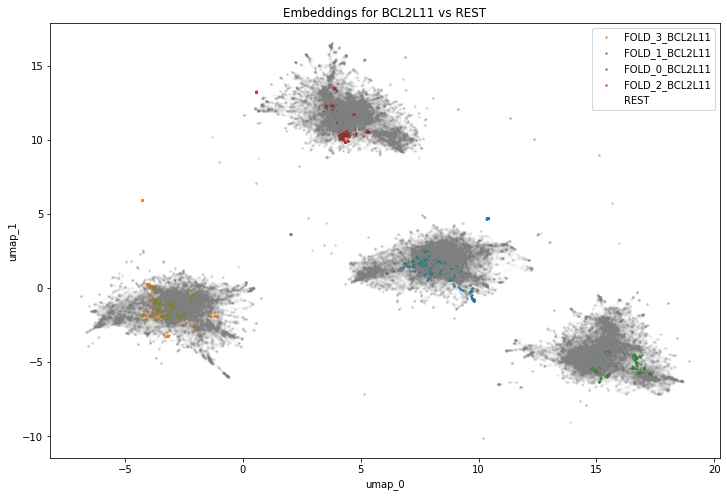

 11%|█         | 5/47 [00:04<00:36,  1.14it/s]

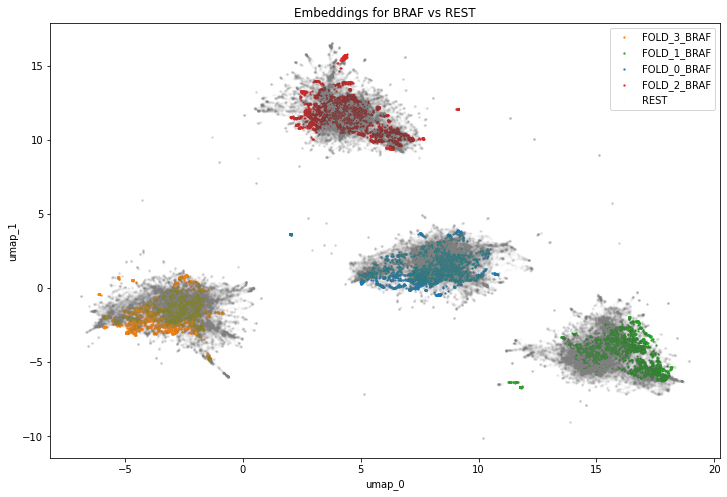

 13%|█▎        | 6/47 [00:05<00:37,  1.11it/s]

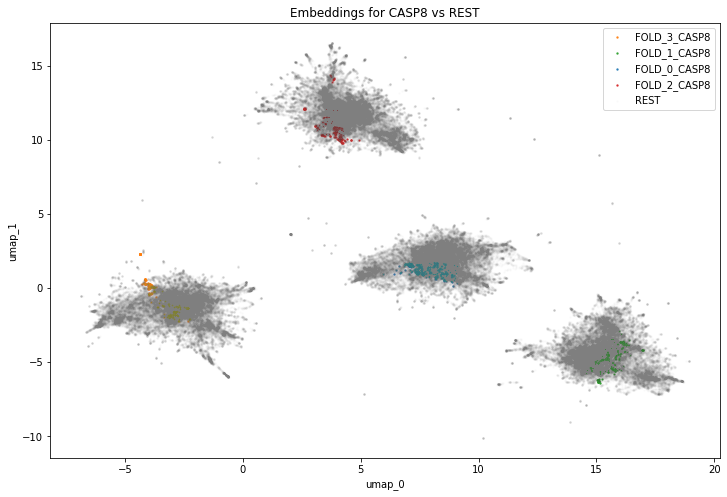

 15%|█▍        | 7/47 [00:06<00:36,  1.09it/s]

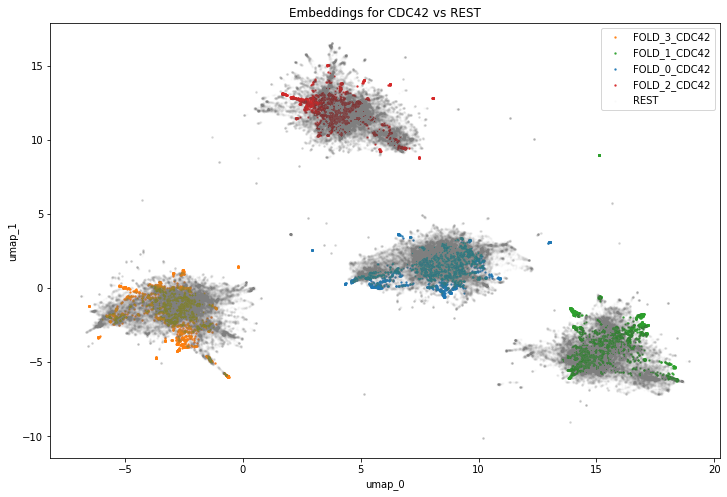

 17%|█▋        | 8/47 [00:07<00:36,  1.08it/s]

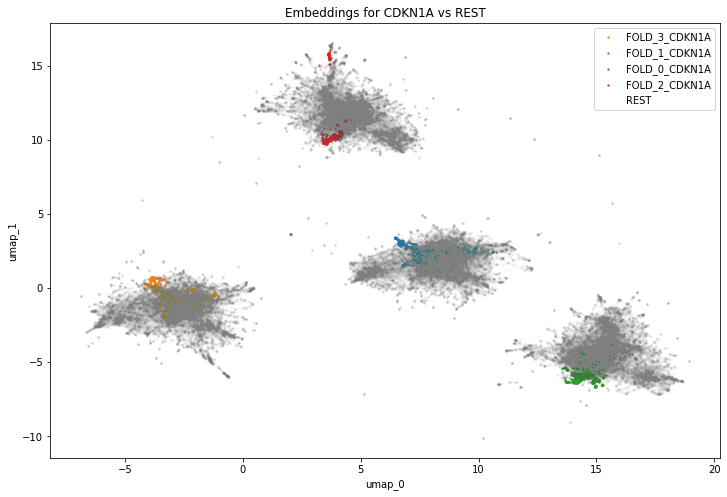

 19%|█▉        | 9/47 [00:08<00:35,  1.09it/s]

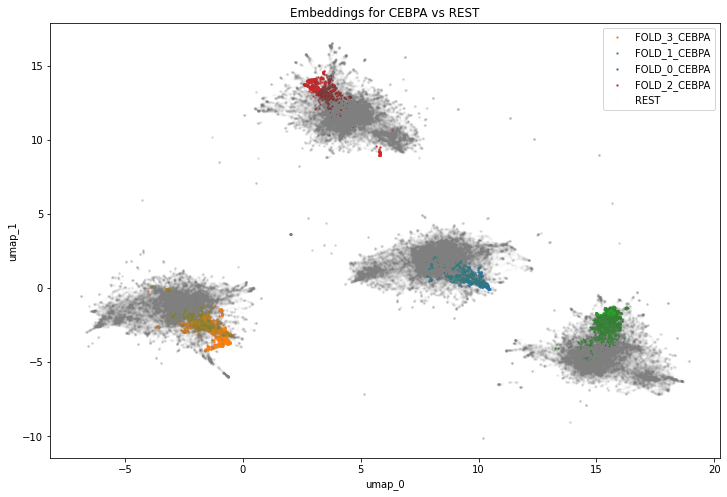

 21%|██▏       | 10/47 [00:09<00:34,  1.08it/s]

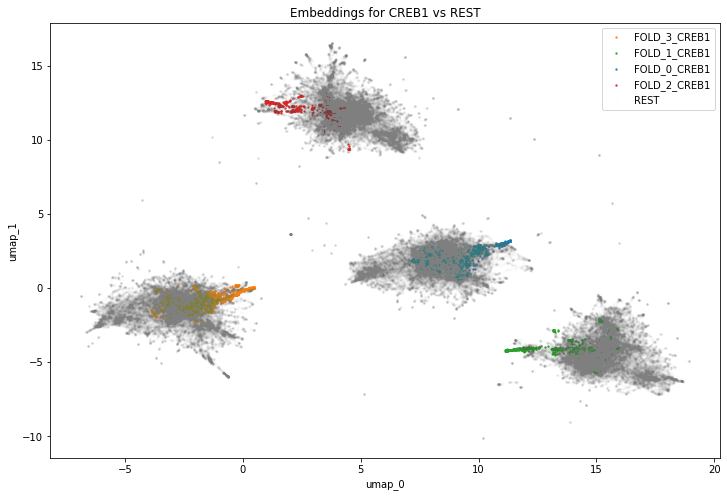

 23%|██▎       | 11/47 [00:10<00:34,  1.04it/s]

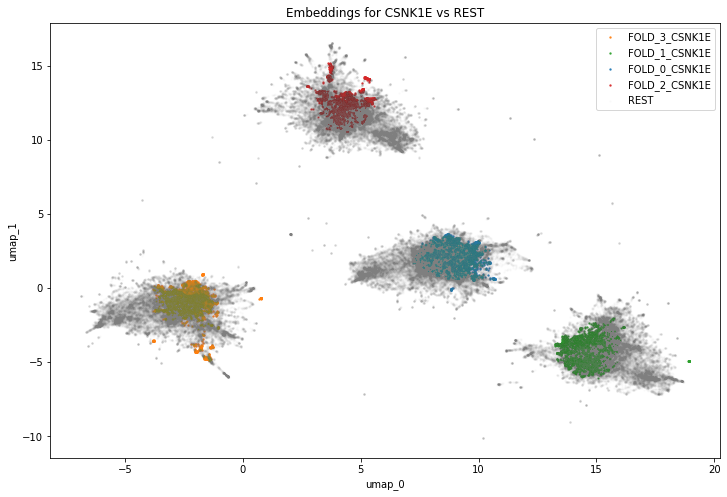

 26%|██▌       | 12/47 [00:11<00:33,  1.05it/s]

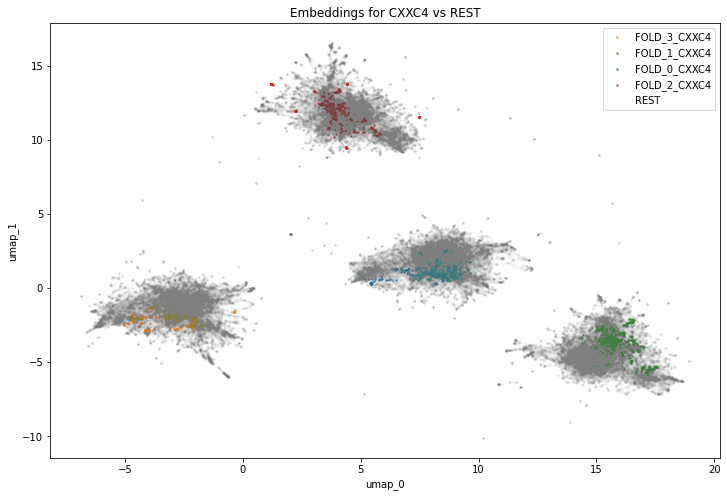

 28%|██▊       | 13/47 [00:11<00:31,  1.06it/s]

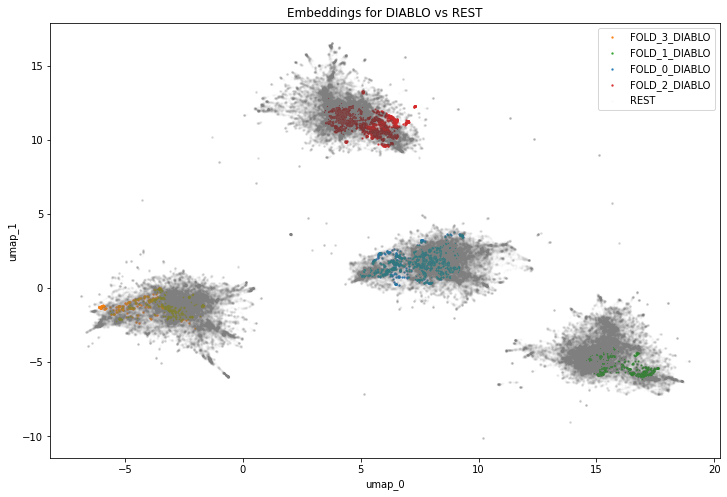

 30%|██▉       | 14/47 [00:12<00:30,  1.06it/s]

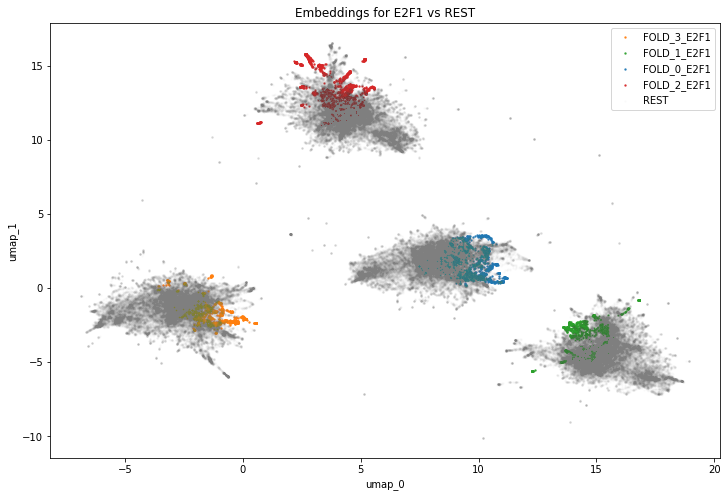

 32%|███▏      | 15/47 [00:13<00:29,  1.07it/s]

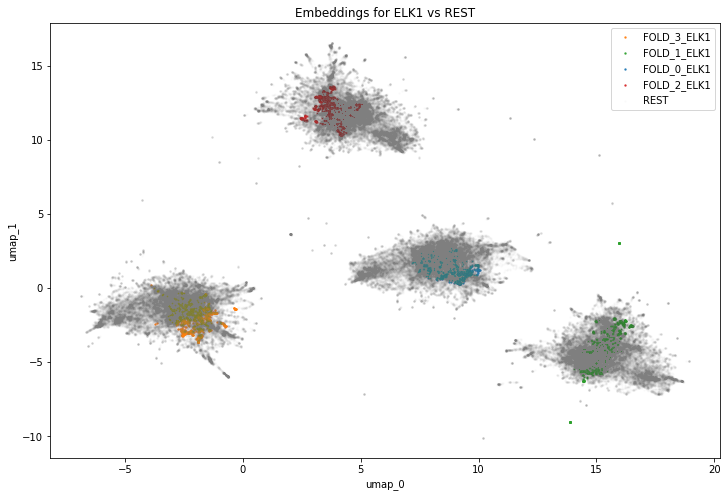

 34%|███▍      | 16/47 [00:14<00:28,  1.07it/s]

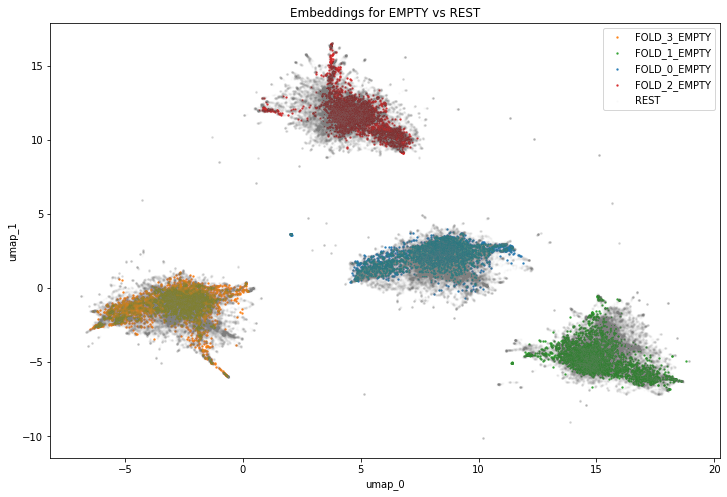

 36%|███▌      | 17/47 [00:15<00:28,  1.07it/s]

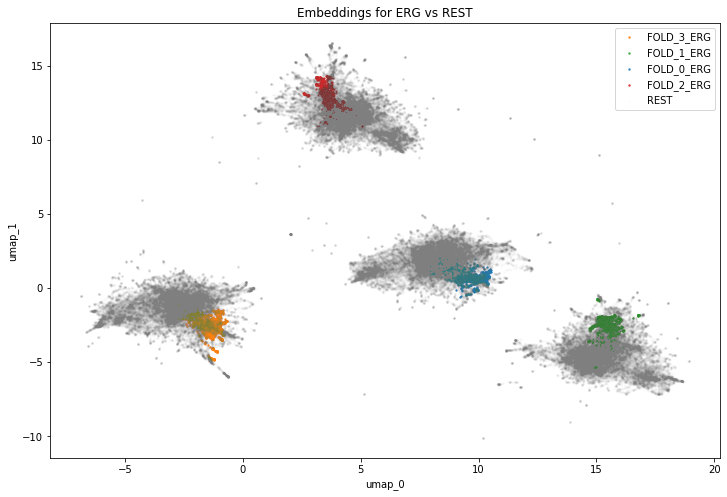

 38%|███▊      | 18/47 [00:16<00:27,  1.07it/s]

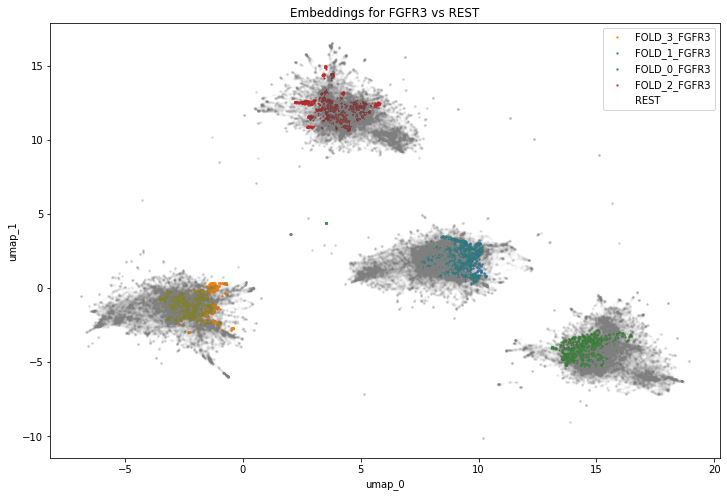

 40%|████      | 19/47 [00:17<00:26,  1.07it/s]

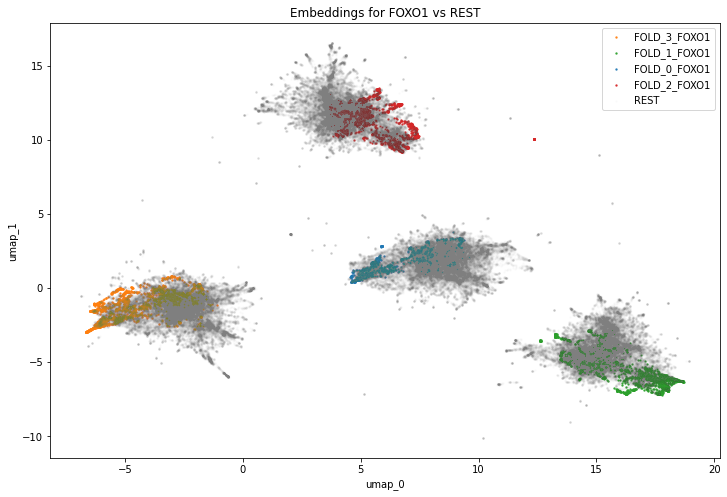

 43%|████▎     | 20/47 [00:18<00:25,  1.07it/s]

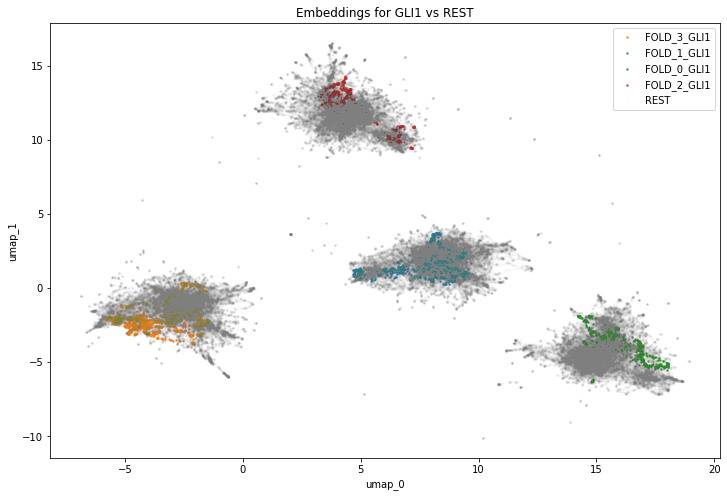

 45%|████▍     | 21/47 [00:19<00:24,  1.08it/s]

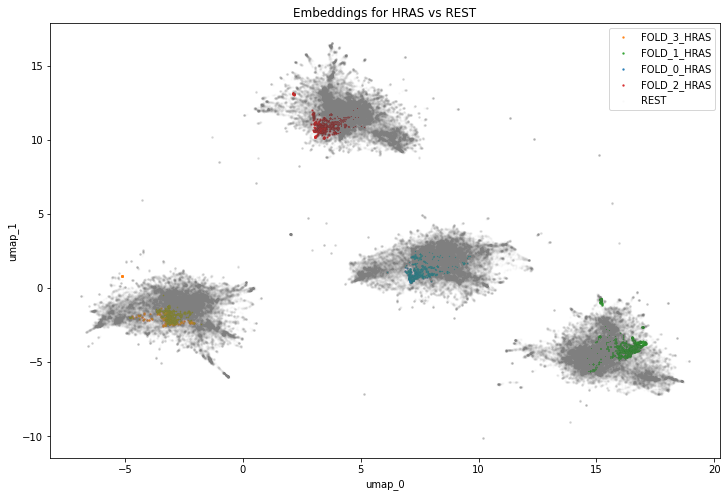

 47%|████▋     | 22/47 [00:20<00:23,  1.08it/s]

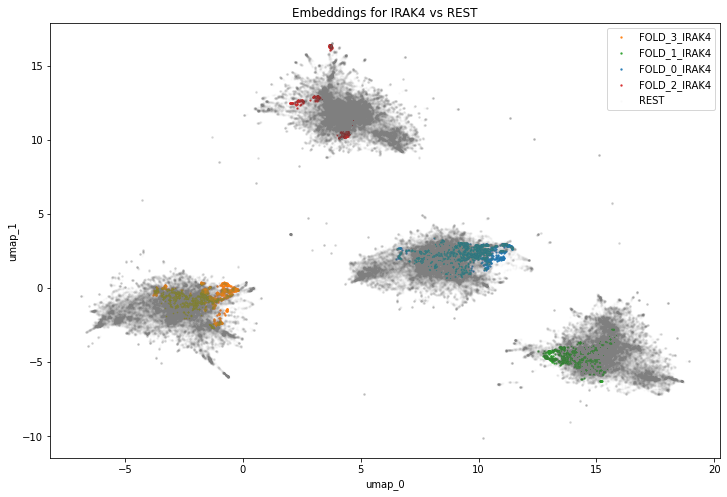

 49%|████▉     | 23/47 [00:21<00:22,  1.08it/s]

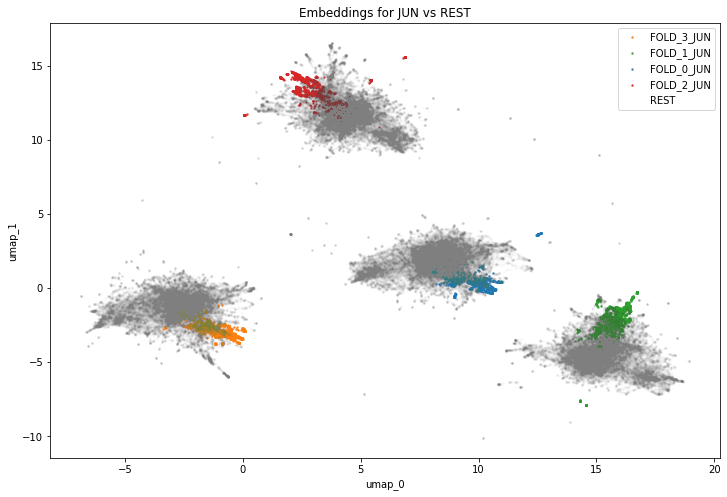

 51%|█████     | 24/47 [00:22<00:21,  1.08it/s]

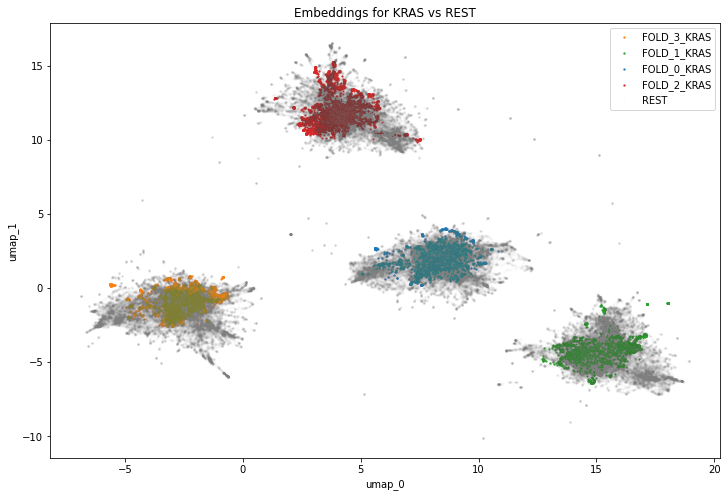

 53%|█████▎    | 25/47 [00:23<00:20,  1.09it/s]

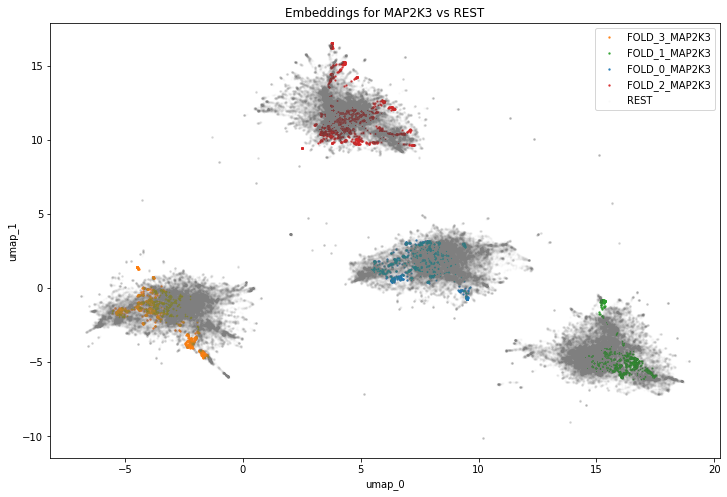

 55%|█████▌    | 26/47 [00:24<00:19,  1.08it/s]

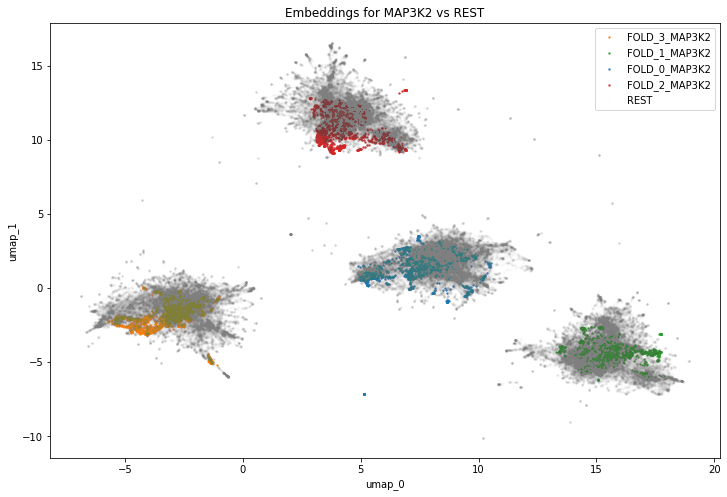

 57%|█████▋    | 27/47 [00:24<00:18,  1.07it/s]

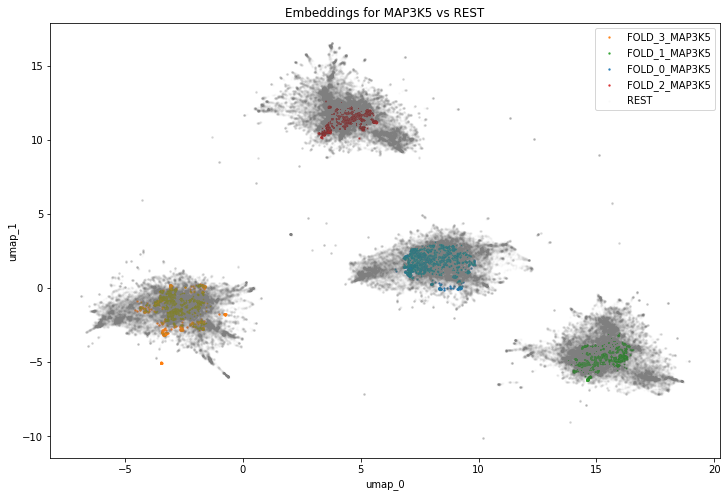

 60%|█████▉    | 28/47 [00:25<00:17,  1.08it/s]

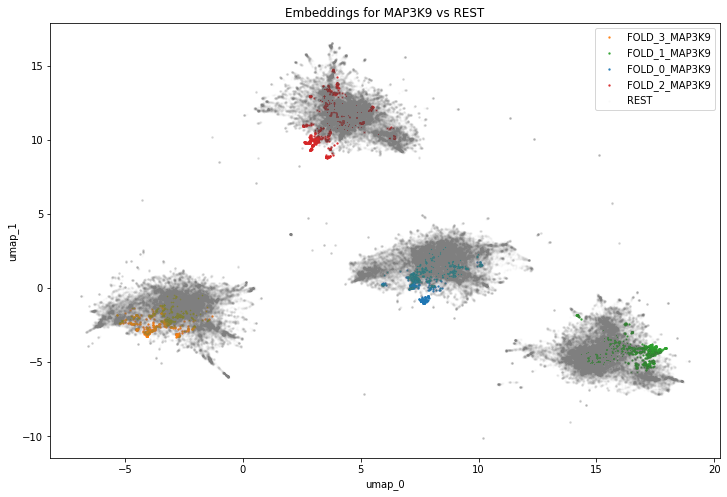

 62%|██████▏   | 29/47 [00:26<00:16,  1.08it/s]

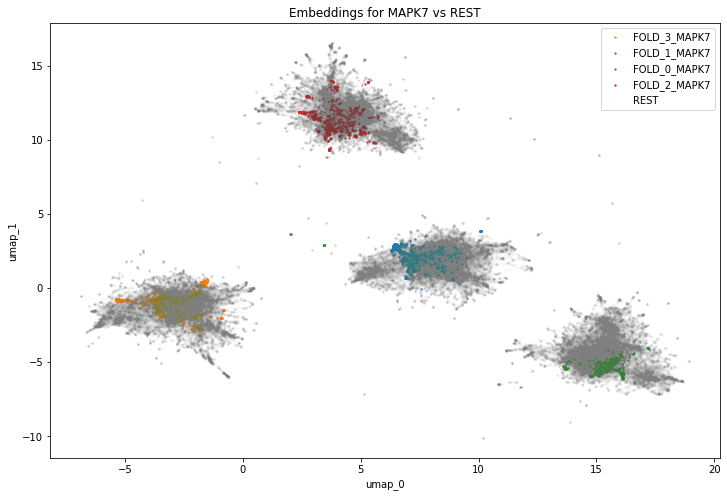

 64%|██████▍   | 30/47 [00:27<00:15,  1.09it/s]

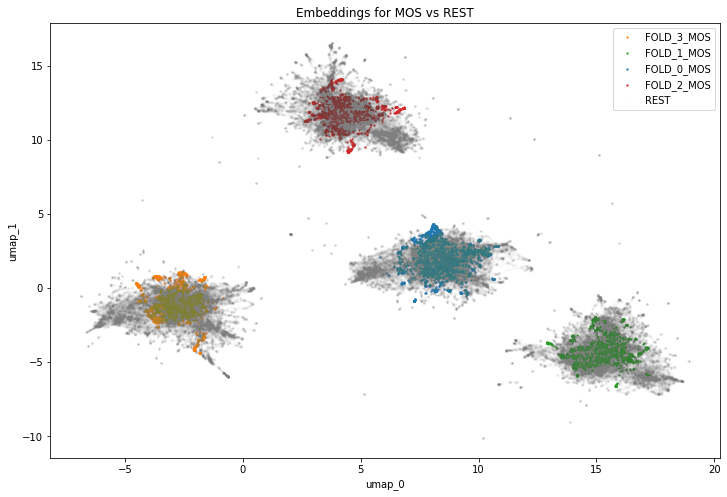

 66%|██████▌   | 31/47 [00:28<00:14,  1.08it/s]

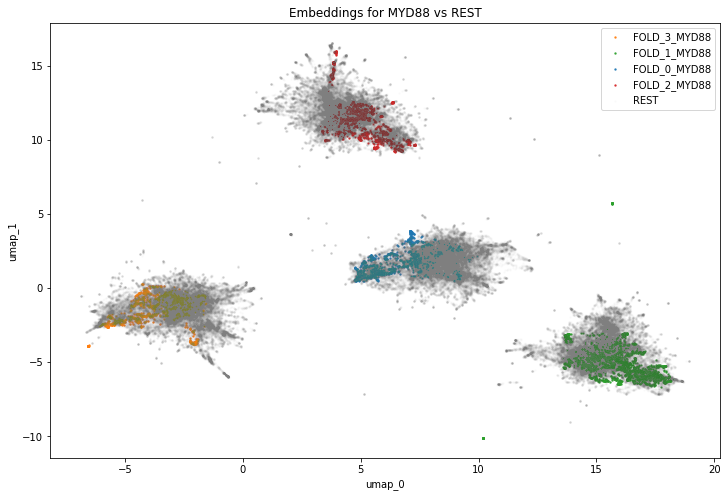

 68%|██████▊   | 32/47 [00:29<00:13,  1.09it/s]

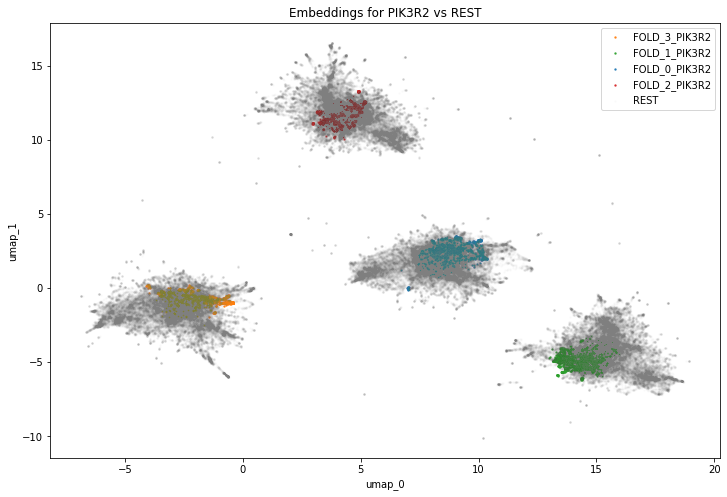

 70%|███████   | 33/47 [00:30<00:12,  1.09it/s]

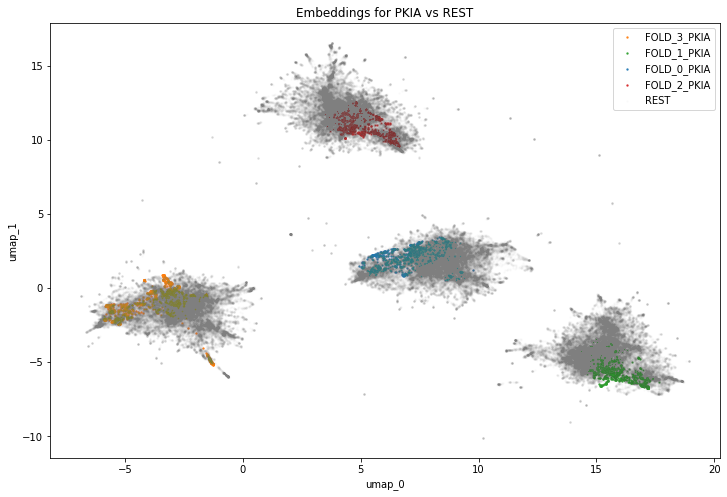

 72%|███████▏  | 34/47 [00:31<00:11,  1.09it/s]

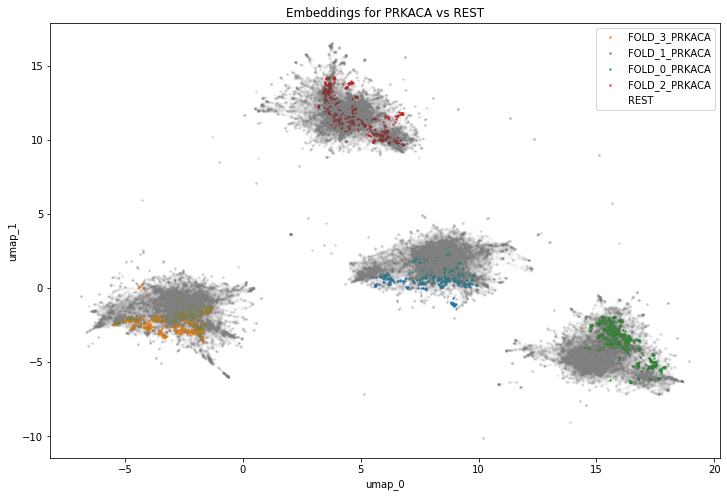

 74%|███████▍  | 35/47 [00:32<00:11,  1.08it/s]

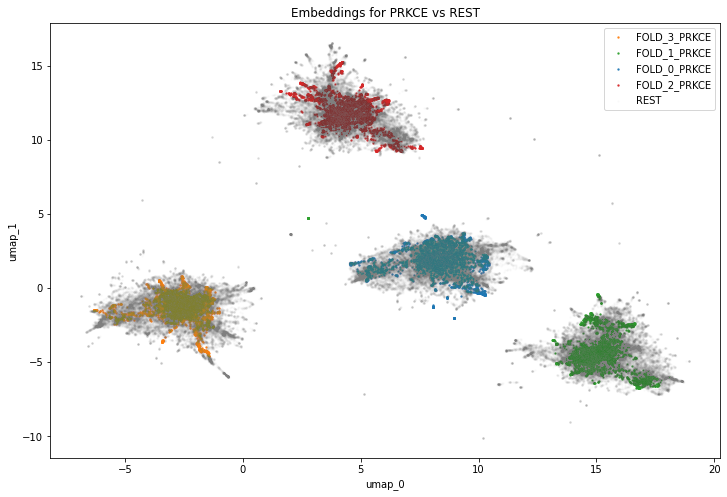

 77%|███████▋  | 36/47 [00:33<00:10,  1.08it/s]

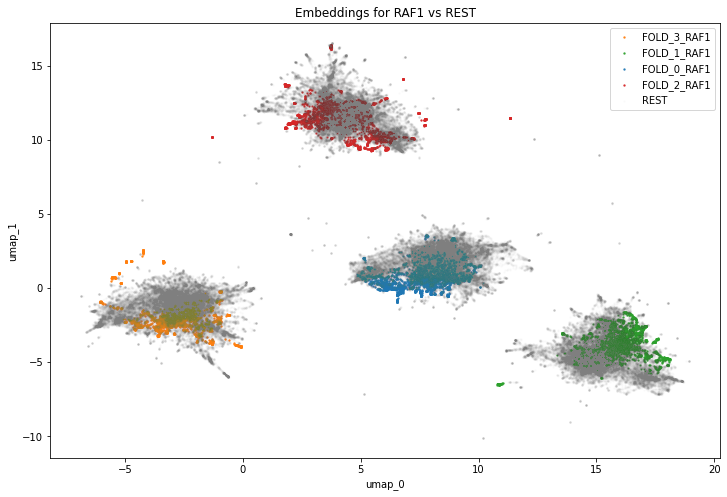

 79%|███████▊  | 37/47 [00:34<00:09,  1.02it/s]

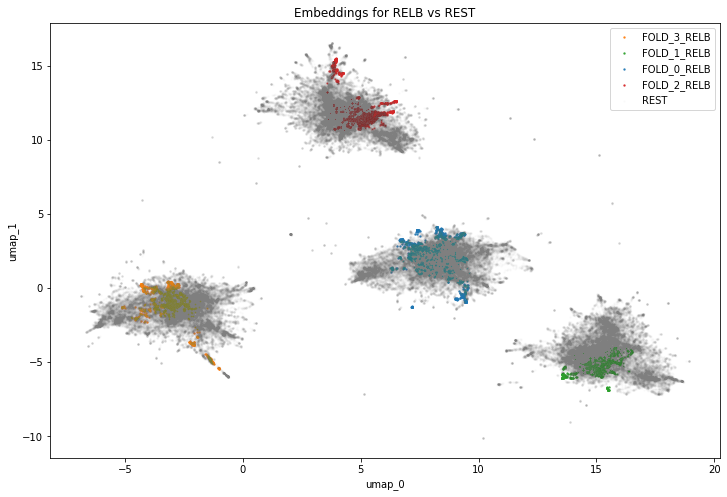

 81%|████████  | 38/47 [00:35<00:08,  1.05it/s]

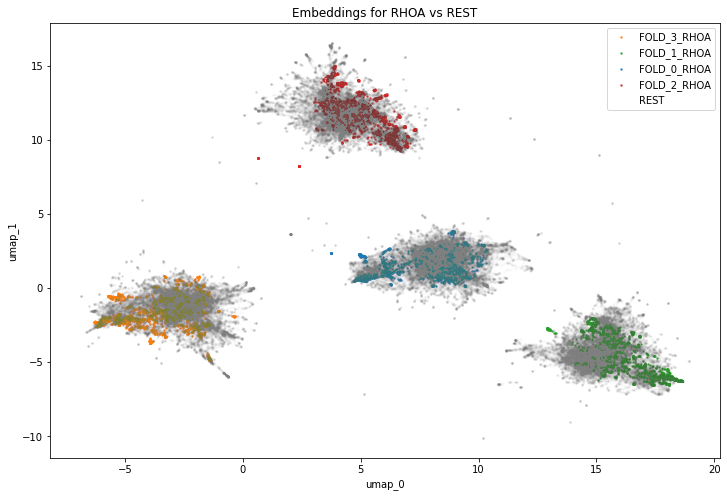

 83%|████████▎ | 39/47 [00:36<00:07,  1.06it/s]

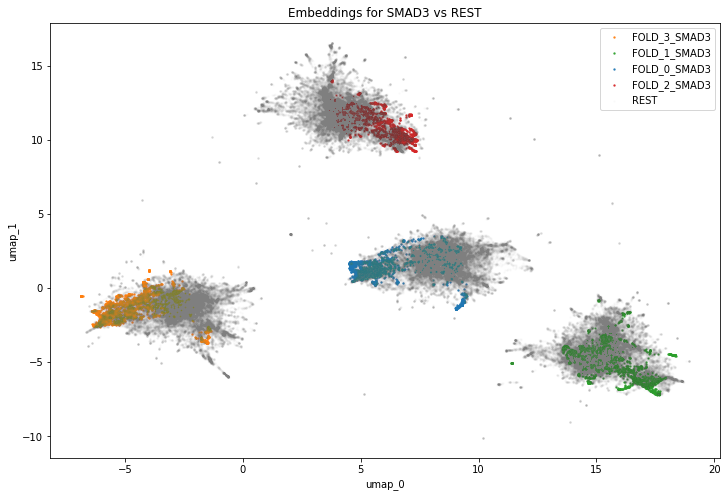

 85%|████████▌ | 40/47 [00:37<00:06,  1.07it/s]

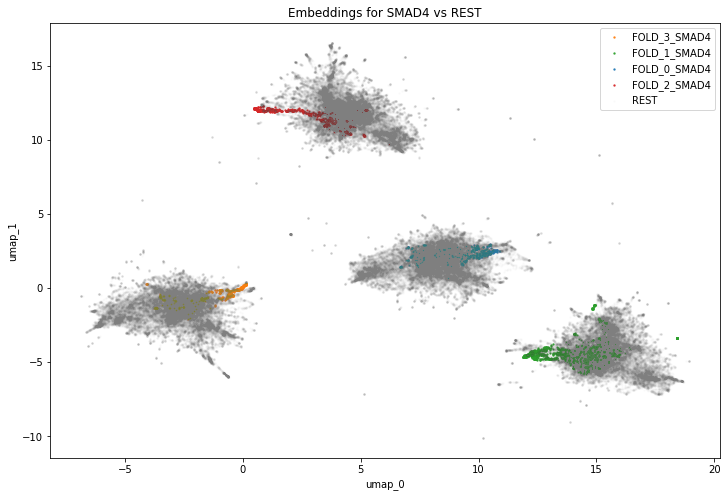

 87%|████████▋ | 41/47 [00:37<00:05,  1.08it/s]

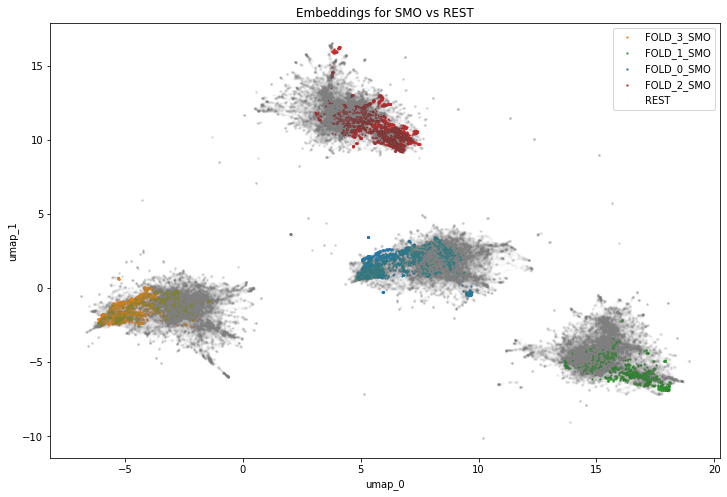

 89%|████████▉ | 42/47 [00:38<00:04,  1.10it/s]

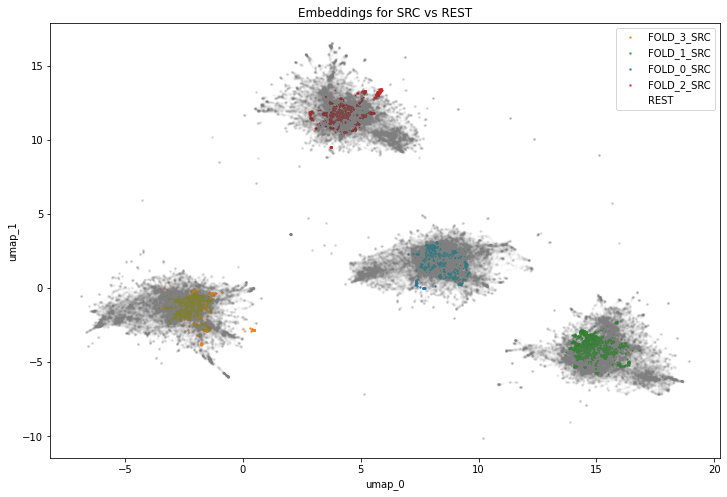

 91%|█████████▏| 43/47 [00:39<00:03,  1.11it/s]

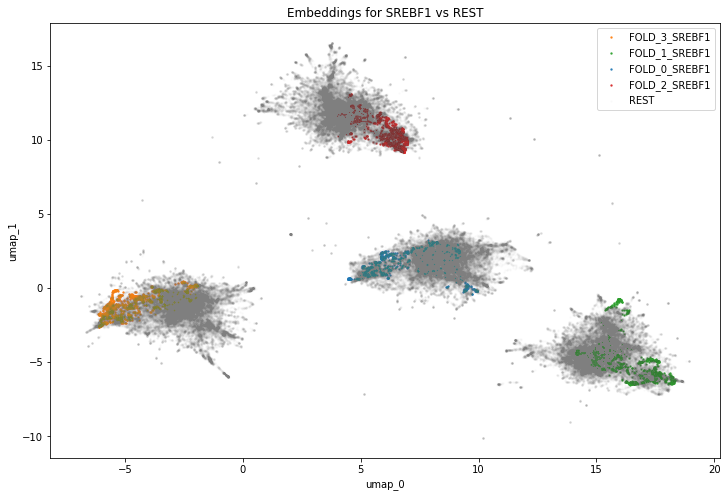

 94%|█████████▎| 44/47 [00:40<00:02,  1.12it/s]

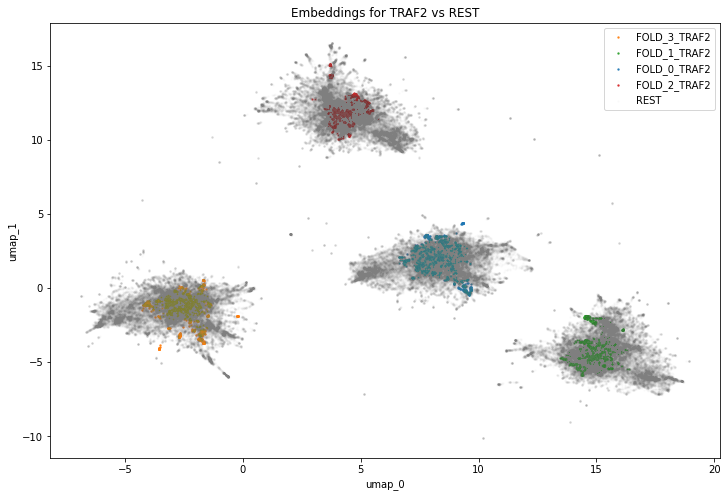

 96%|█████████▌| 45/47 [00:41<00:01,  1.13it/s]

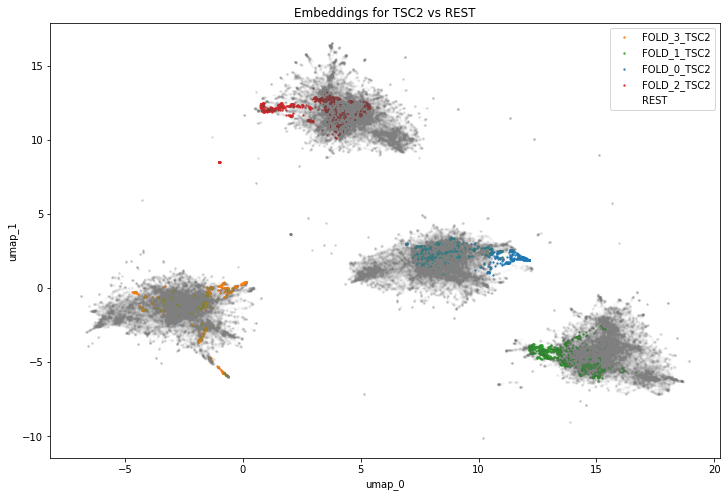

 98%|█████████▊| 46/47 [00:42<00:00,  1.12it/s]

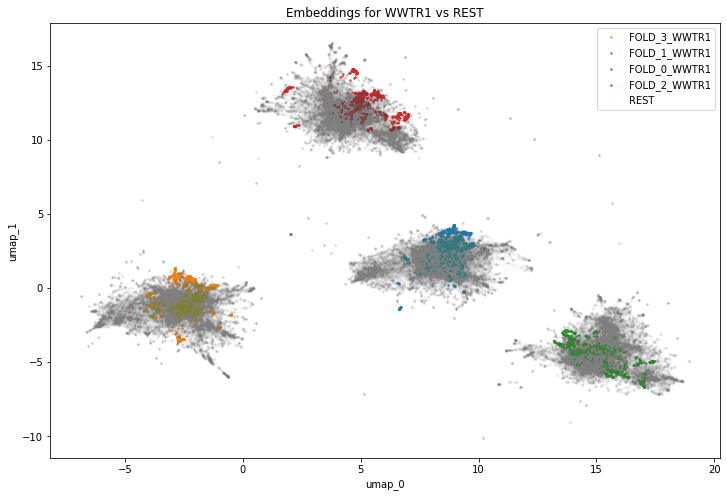

100%|██████████| 47/47 [00:43<00:00,  1.09it/s]


<IPython.core.display.Javascript object>

In [7]:
embs = plot_embs(latents, random_state=1234)

As expected the embeddings group by fold. To remove those batch effects, we will first try to standardize each fold individually.

/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_block(indexer, value, name)
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/pandas/core/indexing.py:723: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  iloc._setitem_with_indexer(indexer, value, self.name)
/home/paysan_d/miniconda3/envs/image2reg/lib/python3.8/site-packages/pandas/core/indexing.py:1732: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https

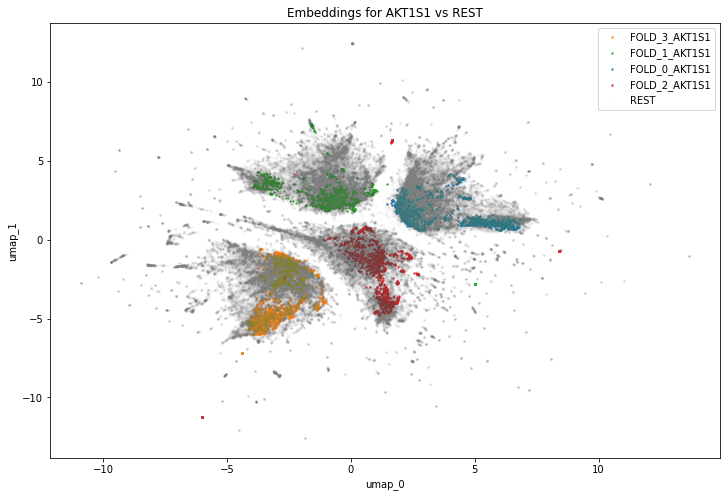

  2%|▏         | 1/47 [00:00<00:39,  1.15it/s]

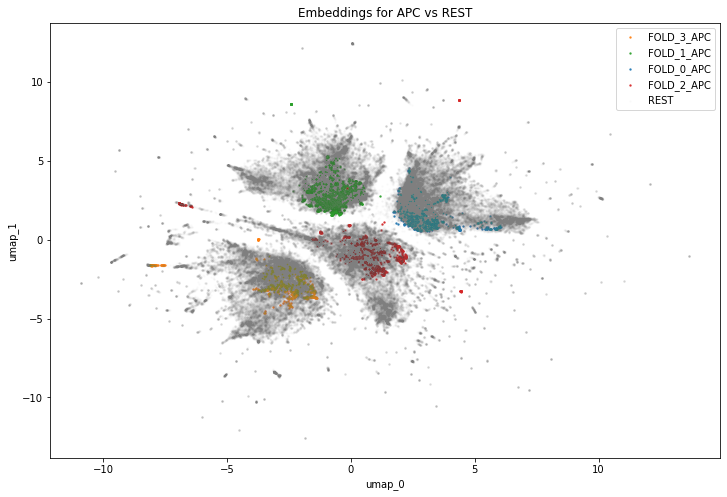

  4%|▍         | 2/47 [00:01<00:39,  1.15it/s]

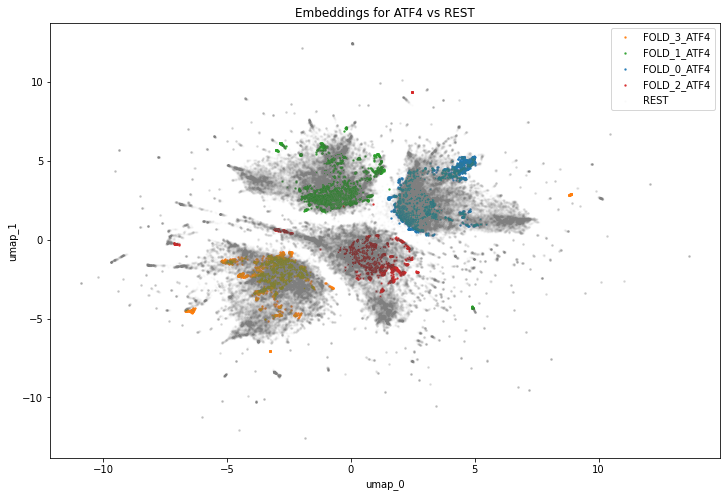

  6%|▋         | 3/47 [00:02<00:38,  1.15it/s]

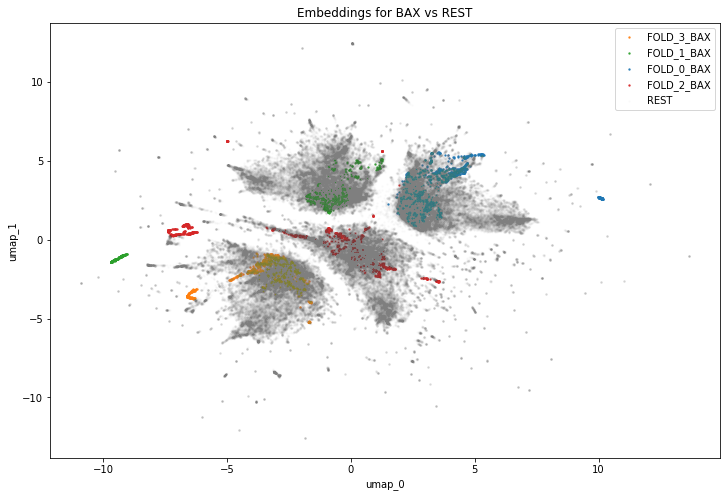

  9%|▊         | 4/47 [00:03<00:37,  1.16it/s]

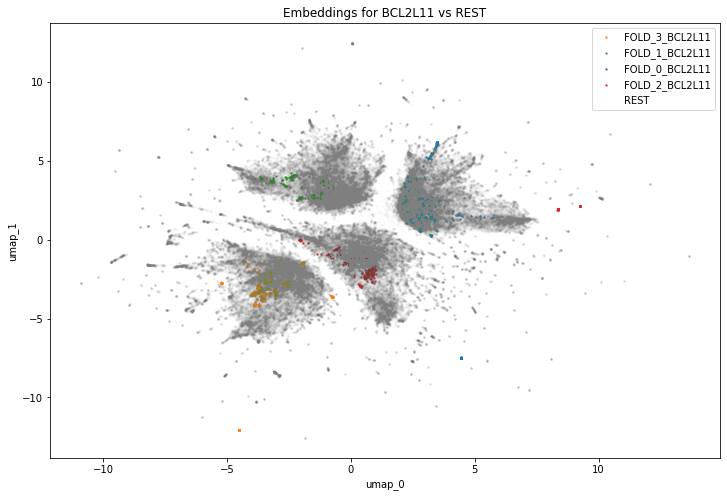

 11%|█         | 5/47 [00:04<00:37,  1.11it/s]

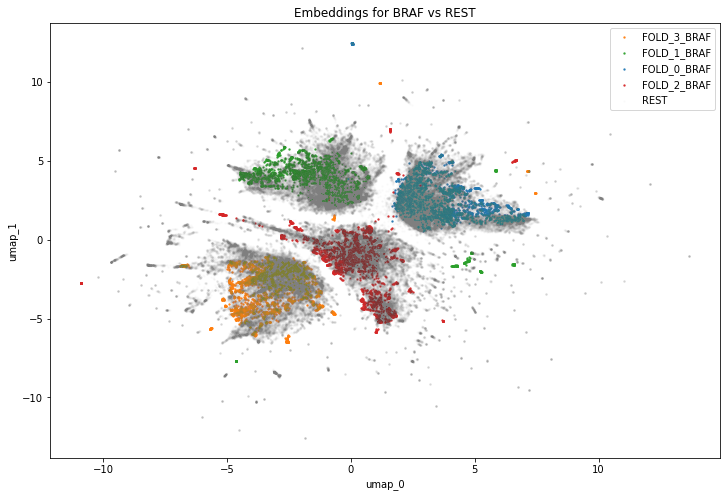

 13%|█▎        | 6/47 [00:05<00:40,  1.01it/s]

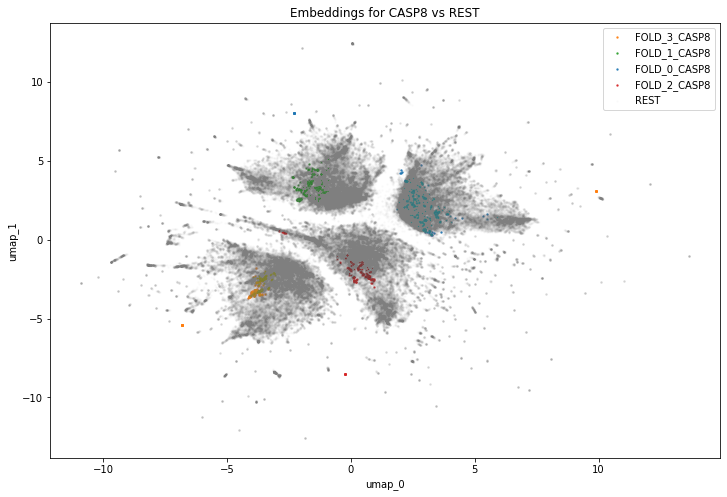

 15%|█▍        | 7/47 [00:06<00:38,  1.04it/s]

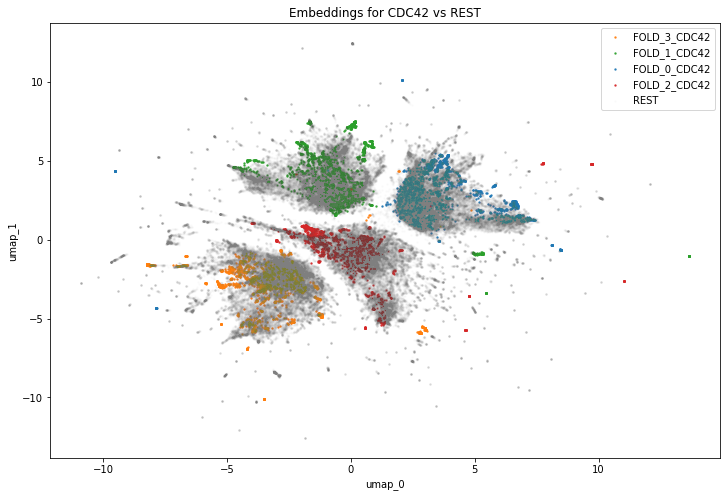

 17%|█▋        | 8/47 [00:07<00:36,  1.06it/s]

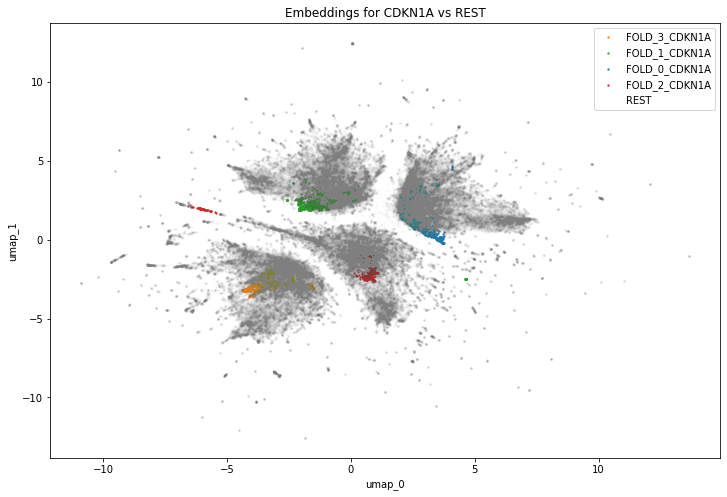

 19%|█▉        | 9/47 [00:08<00:35,  1.08it/s]

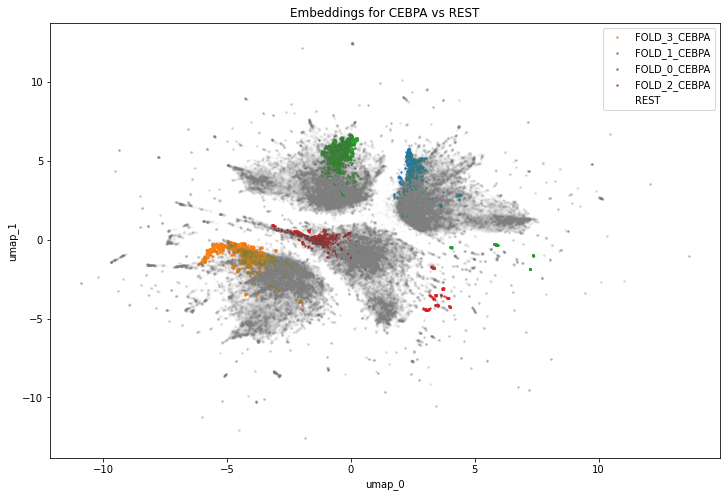

 21%|██▏       | 10/47 [00:09<00:33,  1.10it/s]

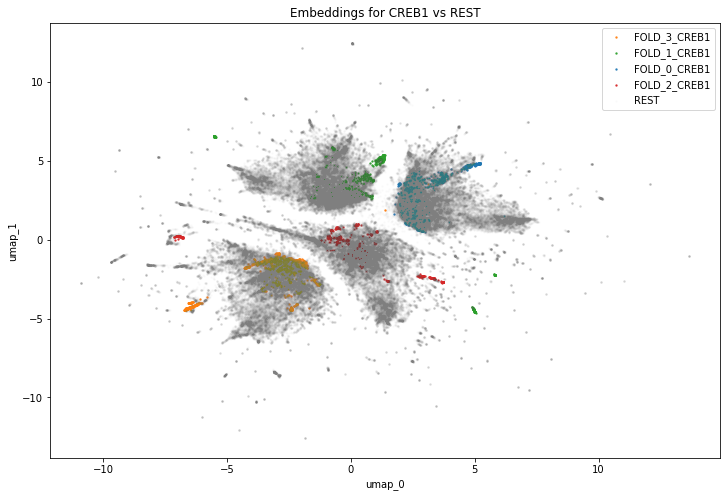

 23%|██▎       | 11/47 [00:10<00:32,  1.11it/s]

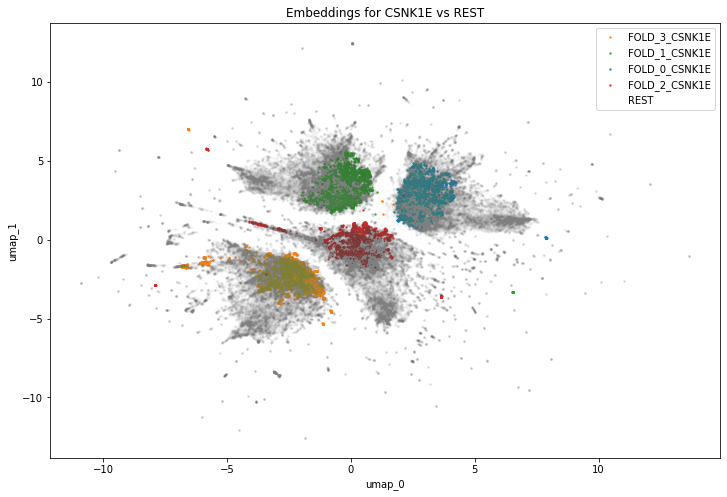

 26%|██▌       | 12/47 [00:10<00:31,  1.11it/s]

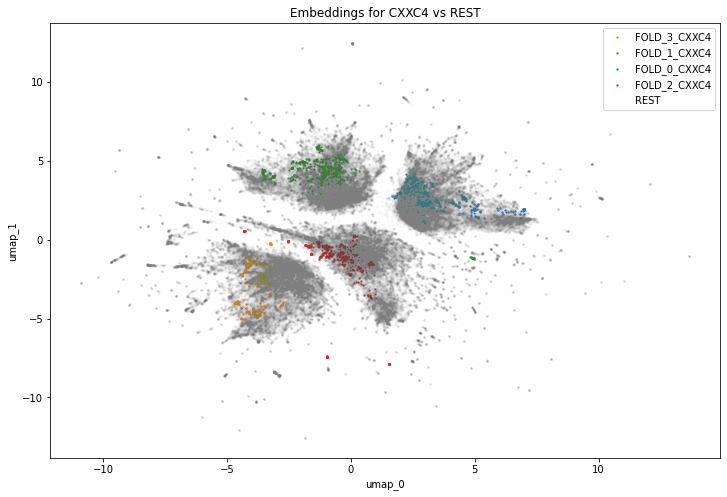

 28%|██▊       | 13/47 [00:11<00:30,  1.12it/s]

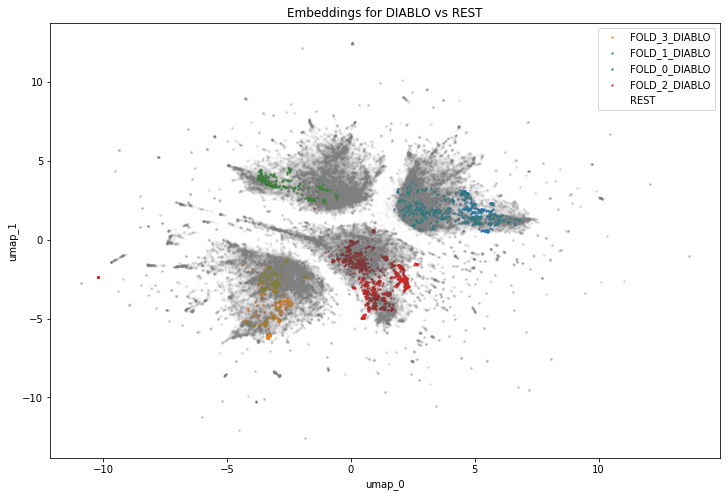

 30%|██▉       | 14/47 [00:12<00:29,  1.13it/s]

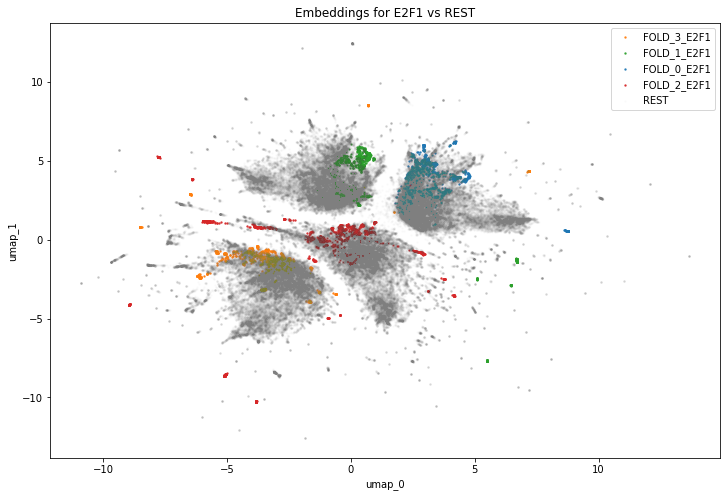

 32%|███▏      | 15/47 [00:13<00:28,  1.12it/s]

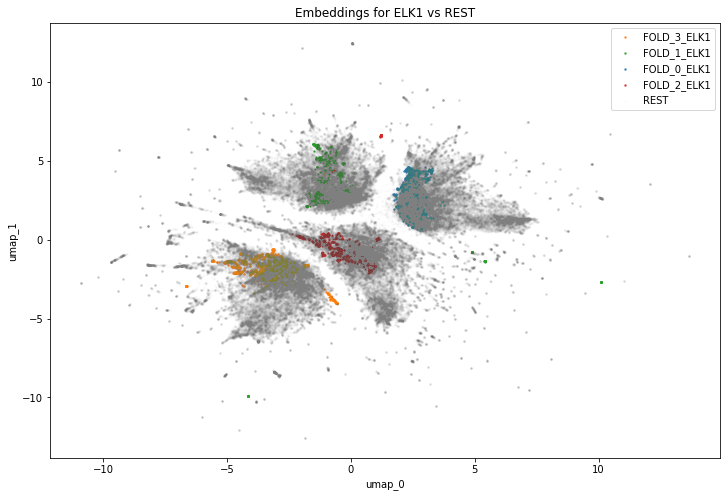

 34%|███▍      | 16/47 [00:14<00:27,  1.11it/s]

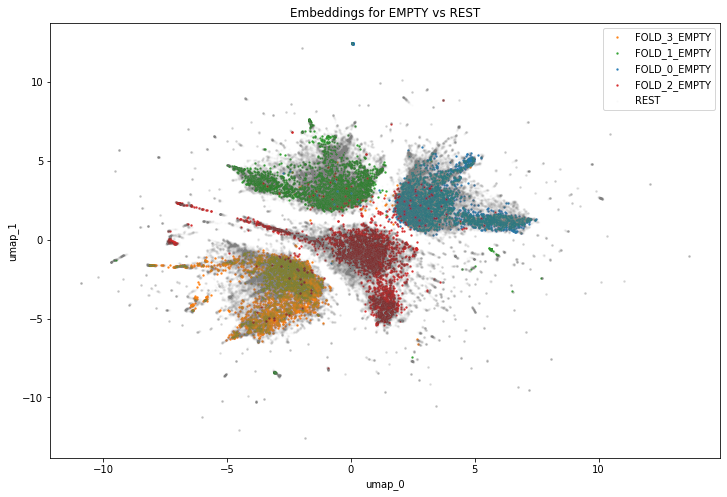

 36%|███▌      | 17/47 [00:15<00:26,  1.11it/s]

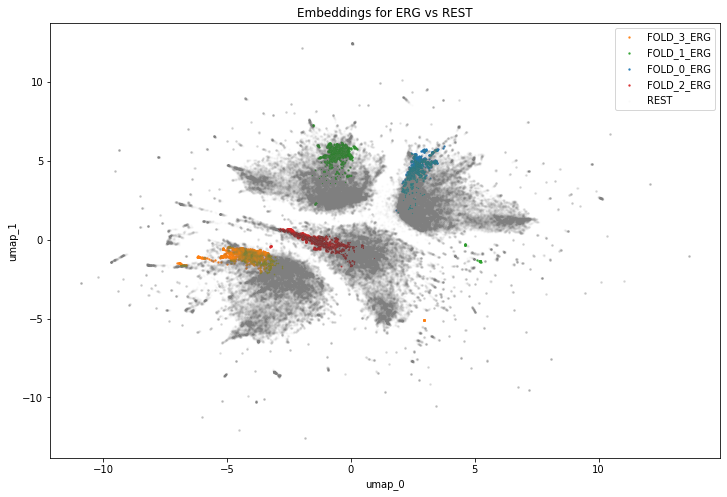

 38%|███▊      | 18/47 [00:16<00:25,  1.12it/s]

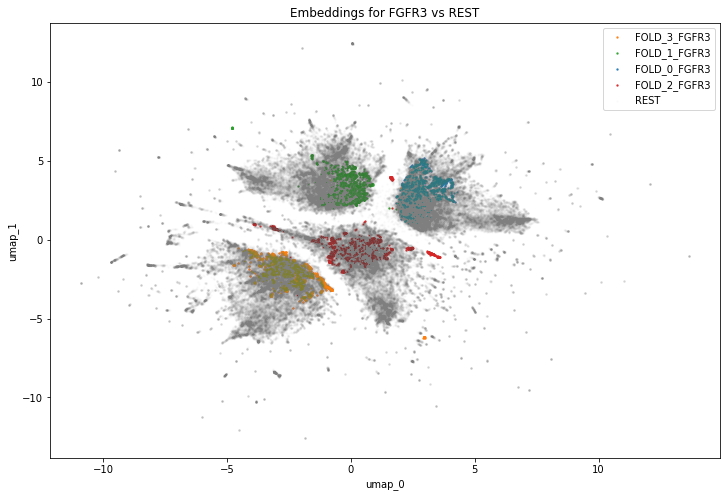

 40%|████      | 19/47 [00:17<00:24,  1.12it/s]

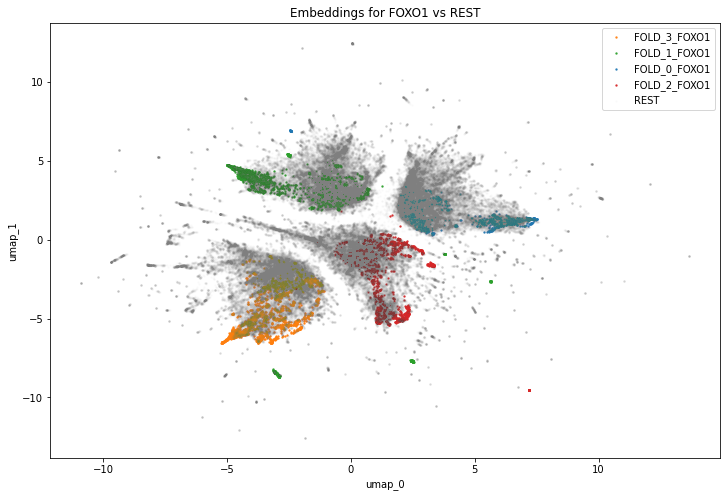

 43%|████▎     | 20/47 [00:18<00:23,  1.13it/s]

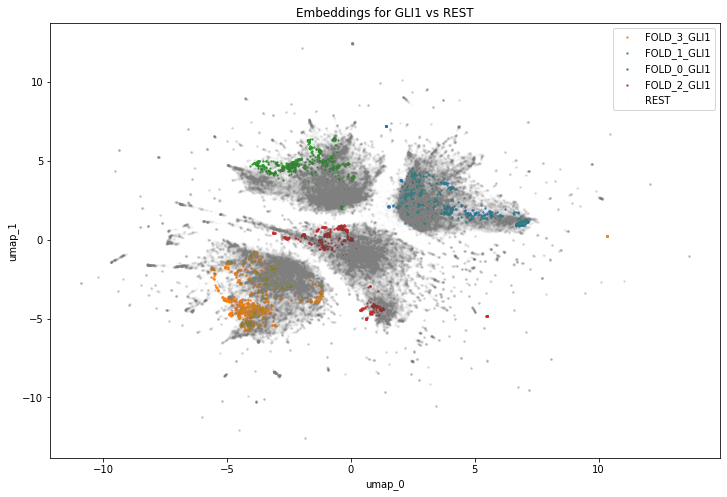

 45%|████▍     | 21/47 [00:18<00:22,  1.13it/s]

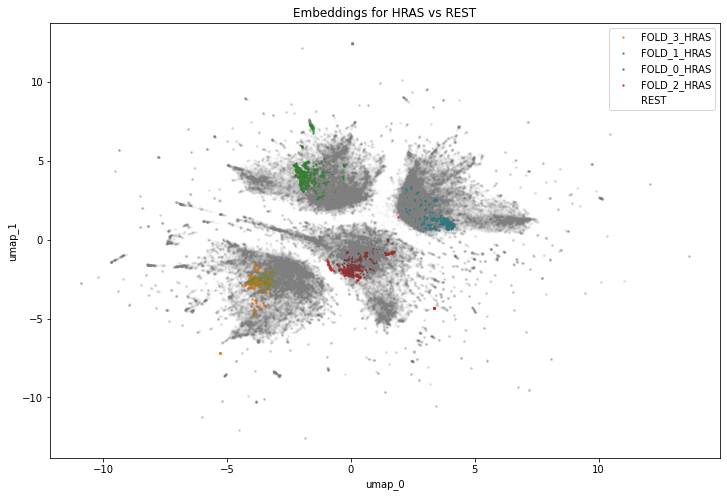

 47%|████▋     | 22/47 [00:19<00:21,  1.14it/s]

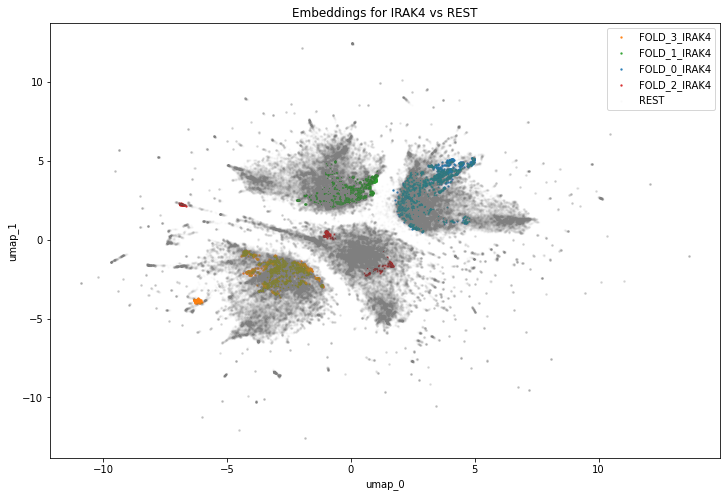

 49%|████▉     | 23/47 [00:20<00:21,  1.12it/s]

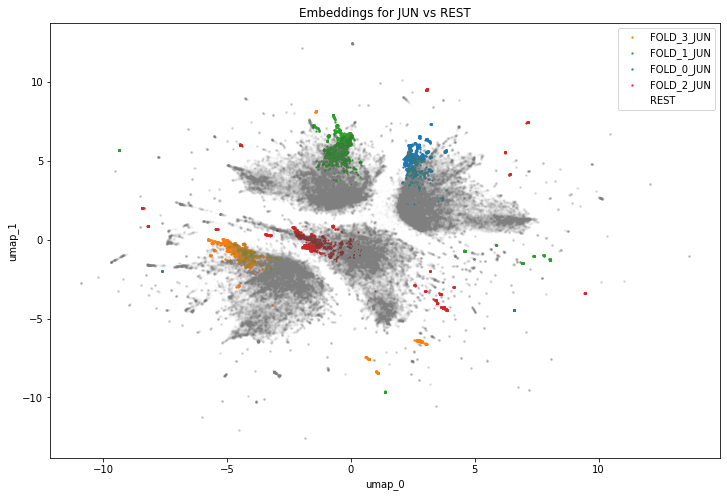

 51%|█████     | 24/47 [00:21<00:21,  1.09it/s]

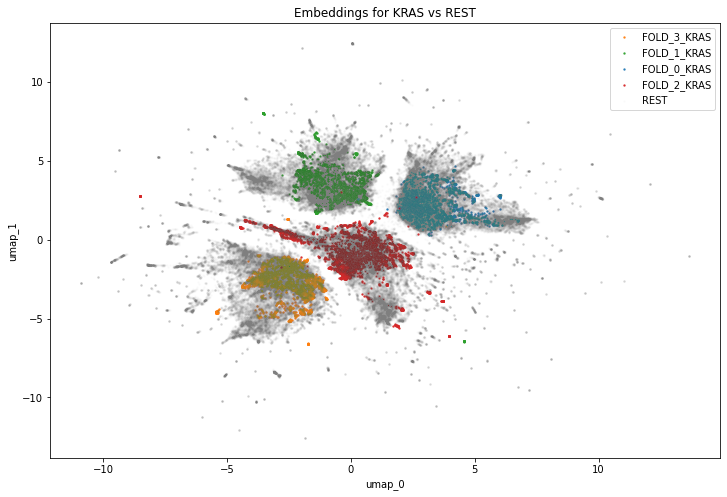

 53%|█████▎    | 25/47 [00:22<00:20,  1.09it/s]

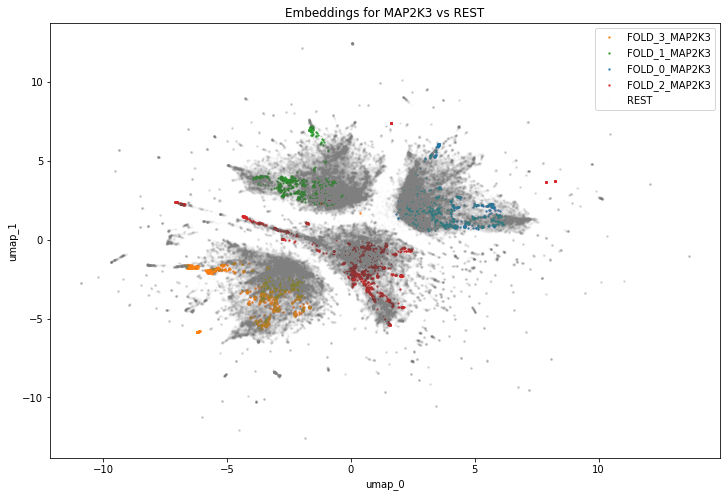

 55%|█████▌    | 26/47 [00:23<00:19,  1.08it/s]

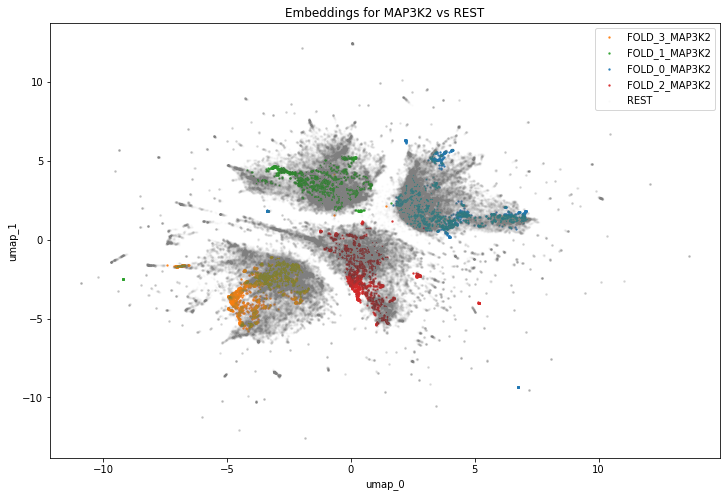

 57%|█████▋    | 27/47 [00:24<00:18,  1.06it/s]

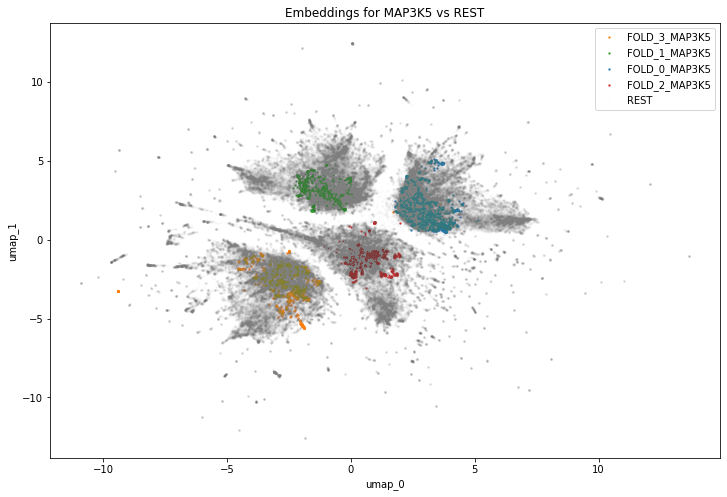

 60%|█████▉    | 28/47 [00:25<00:17,  1.08it/s]

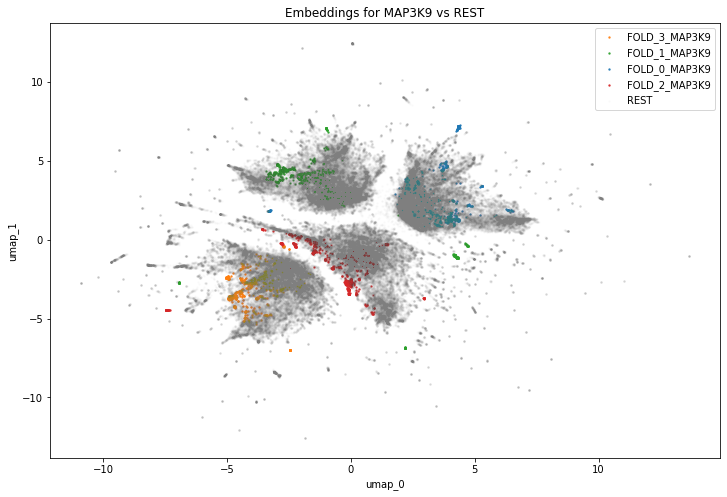

 62%|██████▏   | 29/47 [00:26<00:16,  1.06it/s]

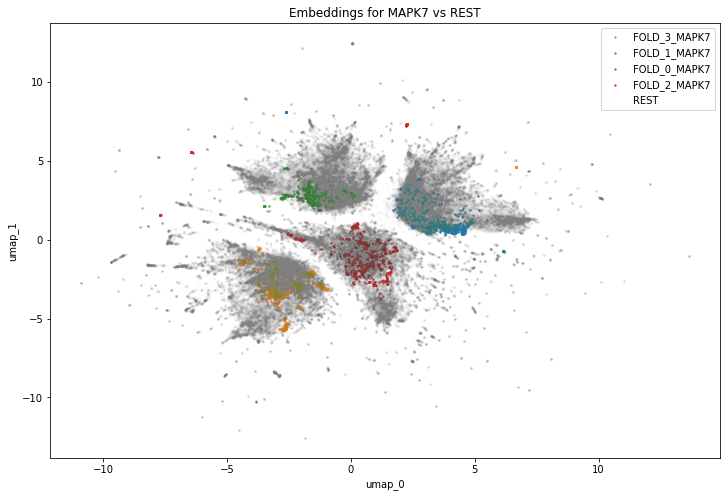

 64%|██████▍   | 30/47 [00:27<00:15,  1.08it/s]

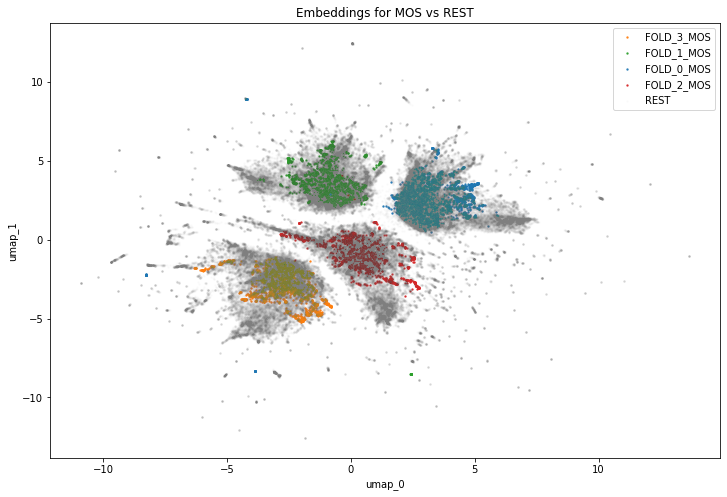

 66%|██████▌   | 31/47 [00:28<00:14,  1.09it/s]

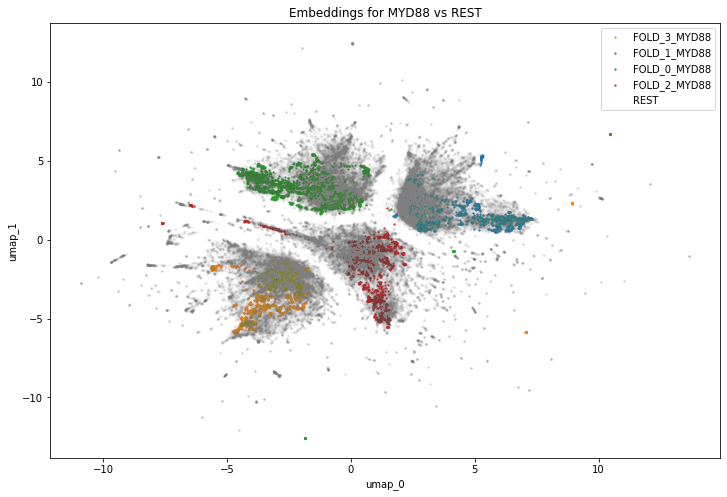

 68%|██████▊   | 32/47 [00:29<00:13,  1.10it/s]

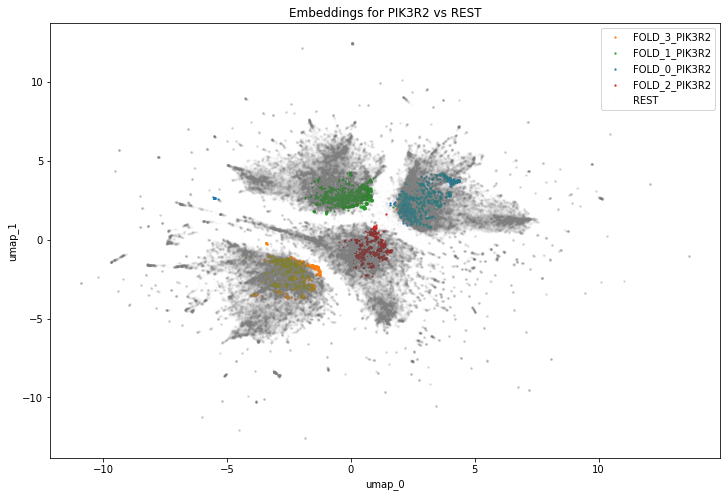

 70%|███████   | 33/47 [00:30<00:13,  1.01it/s]

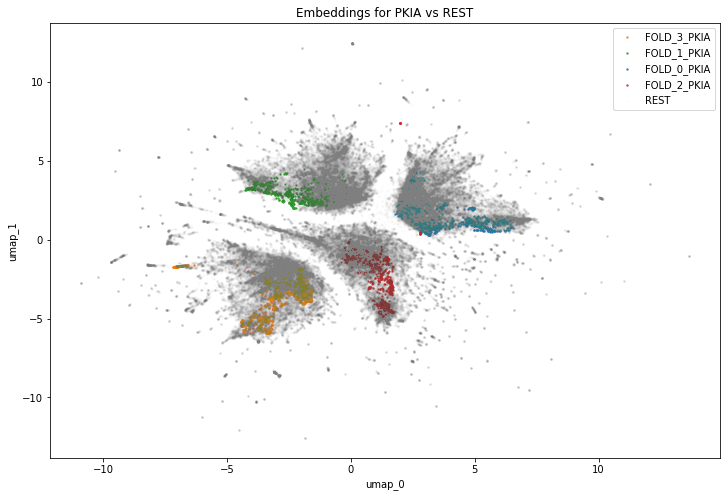

 72%|███████▏  | 34/47 [00:31<00:12,  1.04it/s]

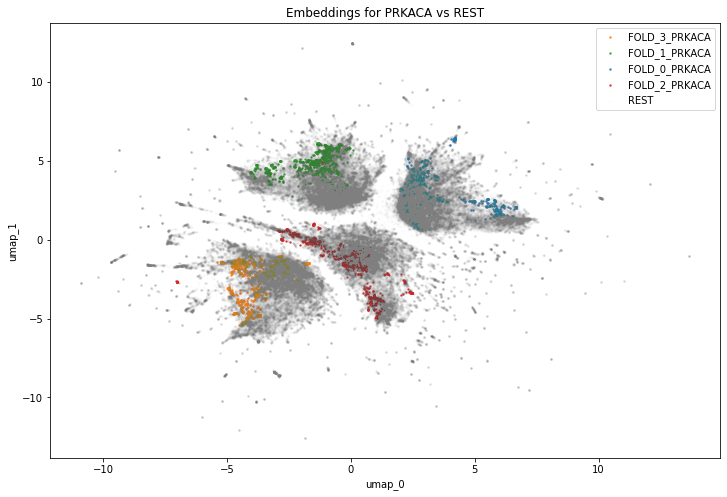

 74%|███████▍  | 35/47 [00:32<00:11,  1.04it/s]

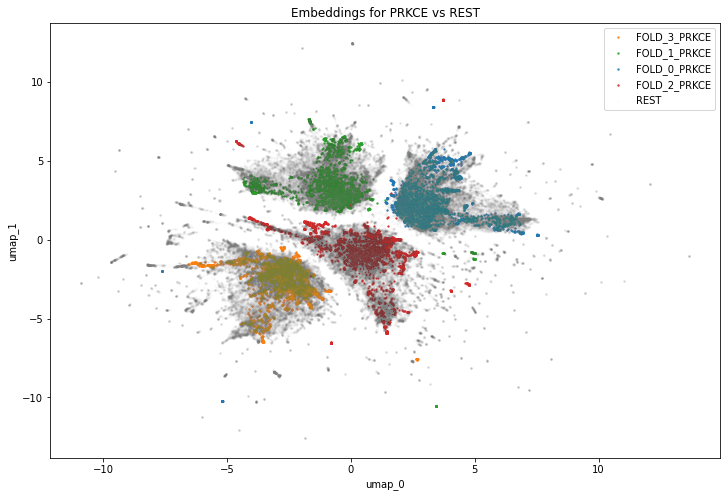

 77%|███████▋  | 36/47 [00:33<00:10,  1.04it/s]

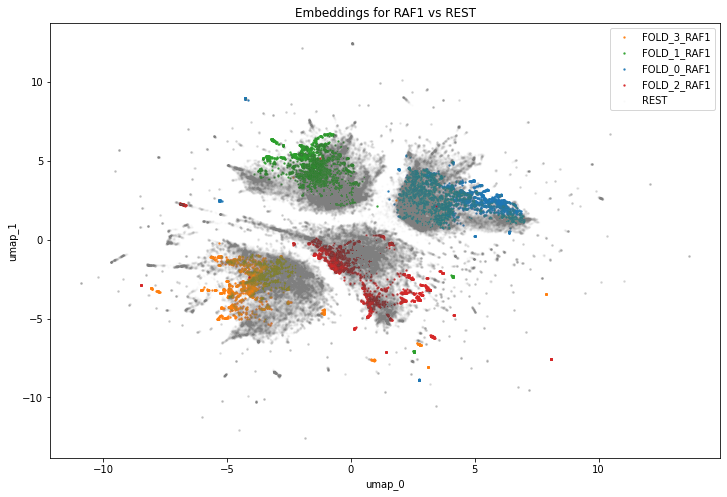

 79%|███████▊  | 37/47 [00:34<00:09,  1.02it/s]

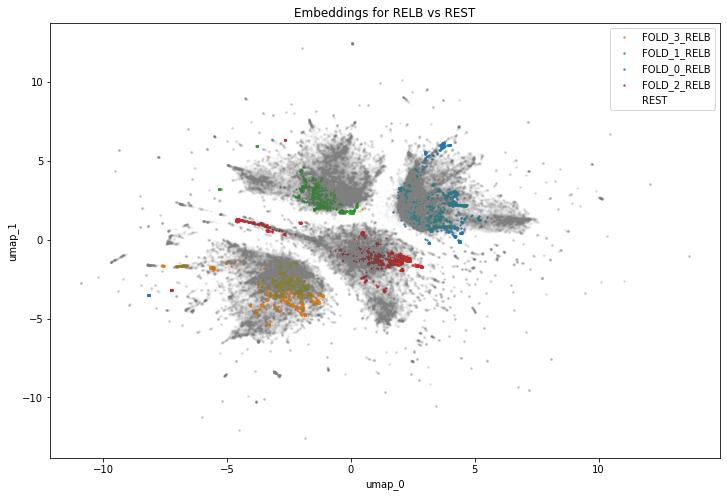

 81%|████████  | 38/47 [00:35<00:08,  1.02it/s]

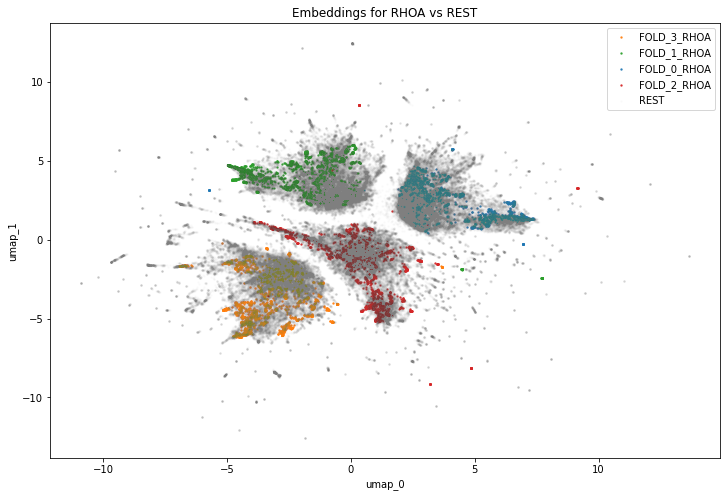

 83%|████████▎ | 39/47 [00:35<00:07,  1.04it/s]

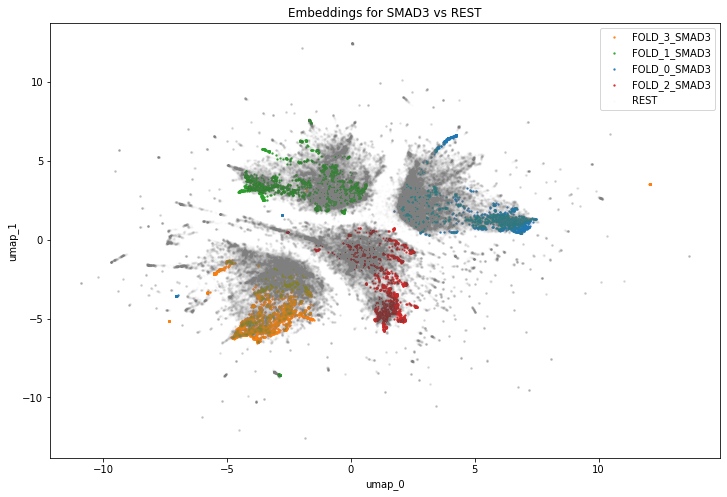

 85%|████████▌ | 40/47 [00:36<00:06,  1.05it/s]

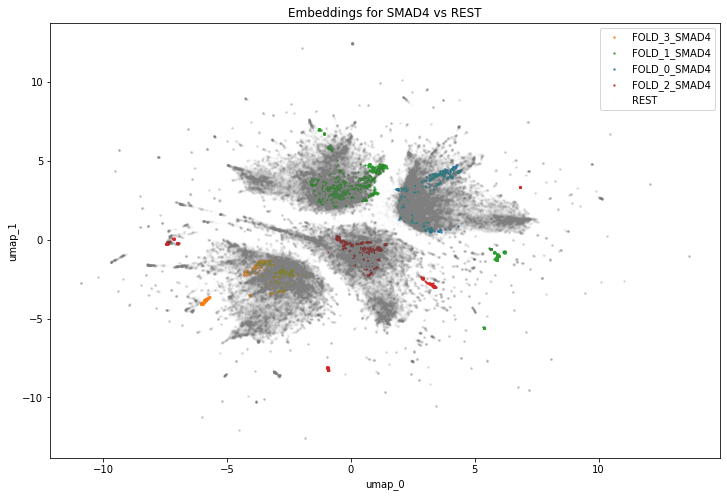

 87%|████████▋ | 41/47 [00:37<00:05,  1.06it/s]

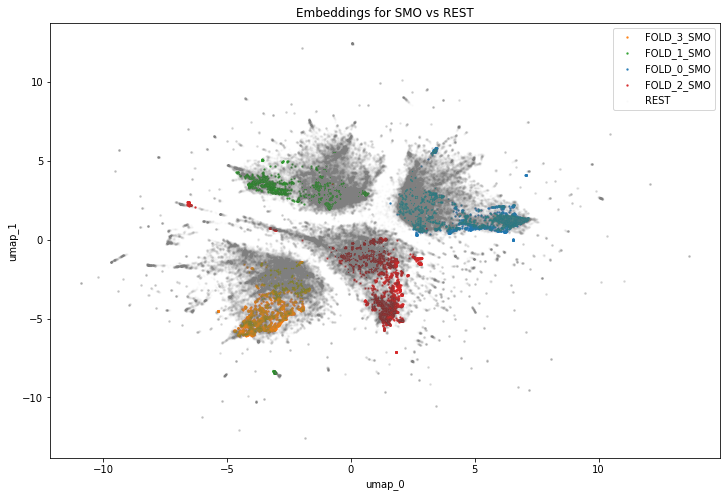

 89%|████████▉ | 42/47 [00:38<00:04,  1.06it/s]

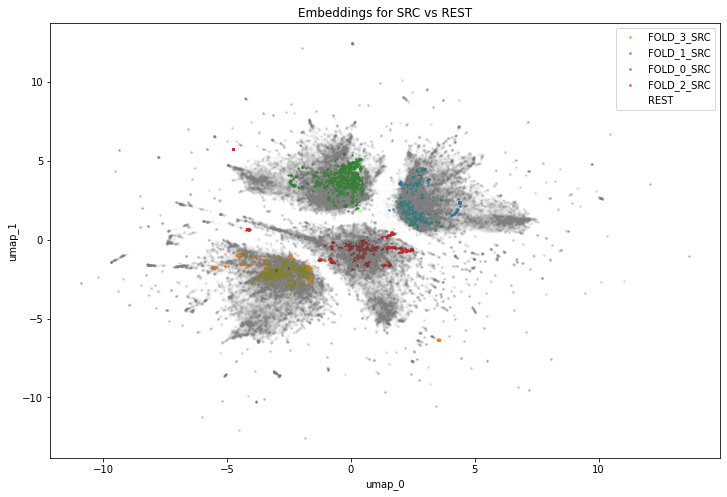

 91%|█████████▏| 43/47 [00:39<00:03,  1.06it/s]

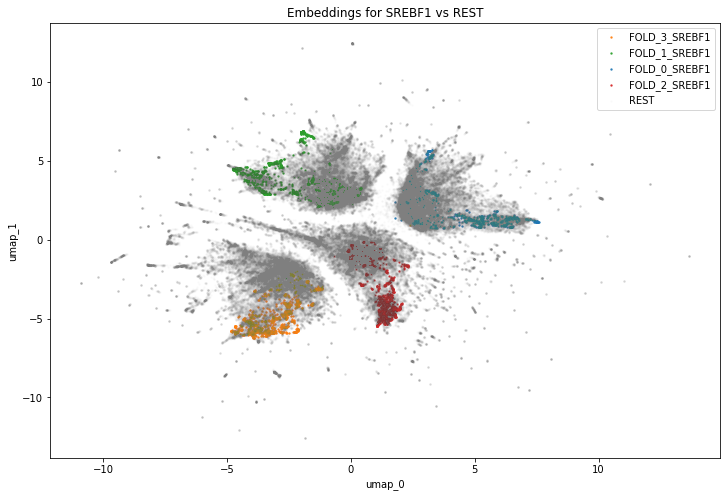

 94%|█████████▎| 44/47 [00:40<00:02,  1.05it/s]

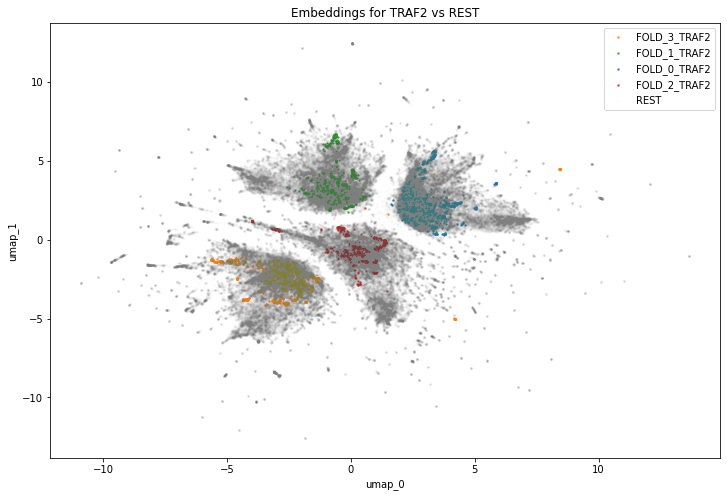

 96%|█████████▌| 45/47 [00:41<00:01,  1.06it/s]

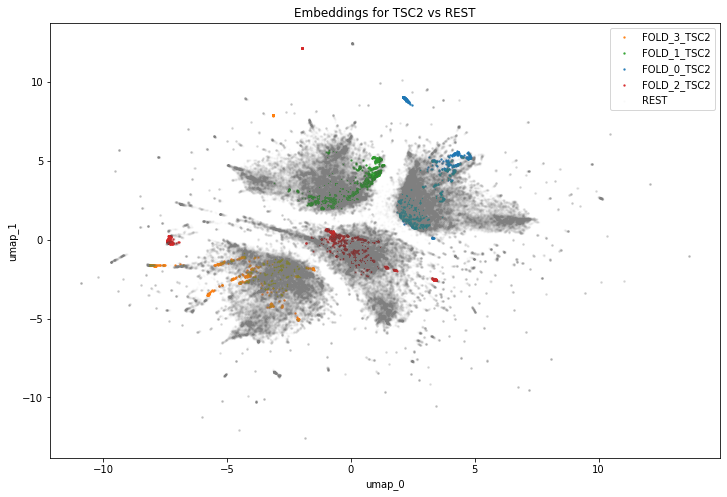

 98%|█████████▊| 46/47 [00:42<00:00,  1.07it/s]

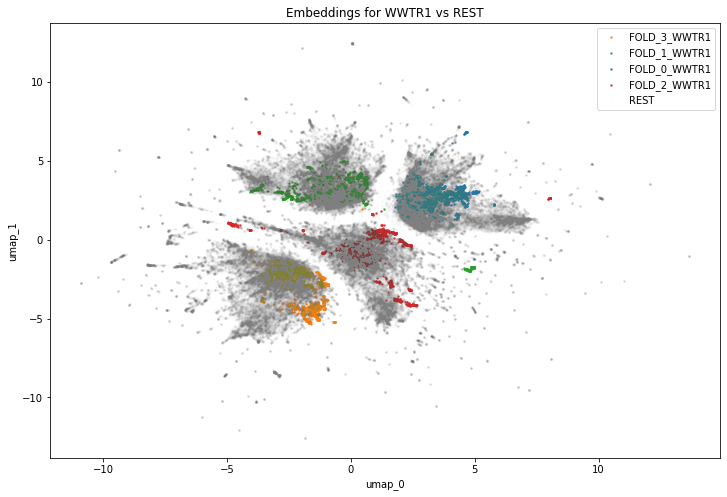

100%|██████████| 47/47 [00:43<00:00,  1.08it/s]


<IPython.core.display.Javascript object>

In [8]:
embs = plot_embs(latents, random_state=1234, normalize_all=False)

To better understand whether the overall structure is comparable between the individual folds we cluster each of the inferred latent spaces corresponding to the individual folds individually using agglomerative clustering, euclidean distances and average linkage. Next, we assess the co-clustering for a varying number of clusters (1-30) using the adjusted mutual information. between any of the fold-specific embeddings. We expect scores close to 1 especially in proximity to the diagnol of the resulting matrices as this would indicate that the structure of which targets group together in the latent space are the similar between the different inferred latent spaces.

To obtain a single signature for each condition, we group the latent embeddings by the respective targets and folds and compute the corresponding median embedding for each target. Next, we baseline each embedding by subtracting the signature of the negative control conditions.

In [9]:
fold_latents = []
for i in range(len(all_latents)):
    fold_ls = all_latents[i].copy()
    fold_ls.loc[:, "labels"] = fold_ls.loc[:, "labels"].map(label_dict)
    fold_ls = fold_ls.groupby("labels").median()
    #     fold_ls = fold_ls - fold_ls.loc["EMPTY"]
    # fold_ls = fold_ls.drop(index=["EMPTY"])
    fold_latents.append(fold_ls.sort_index())

<IPython.core.display.Javascript object>

#### Euclidean distance-based clustering

In [10]:
euc_amis = []
names = []
for i in tqdm(range(len(fold_latents))):
    names.append("fold_{}".format(i))
    for j in range(len(fold_latents)):
        euc_amis.append(
            compute_ami_matrix(
                fold_latents[i],
                fold_latents[j],
                affinity="euclidean",
                n_max_clusters=30,
            )
        )

100%|██████████| 4/4 [02:13<00:00, 33.48s/it]


<IPython.core.display.Javascript object>

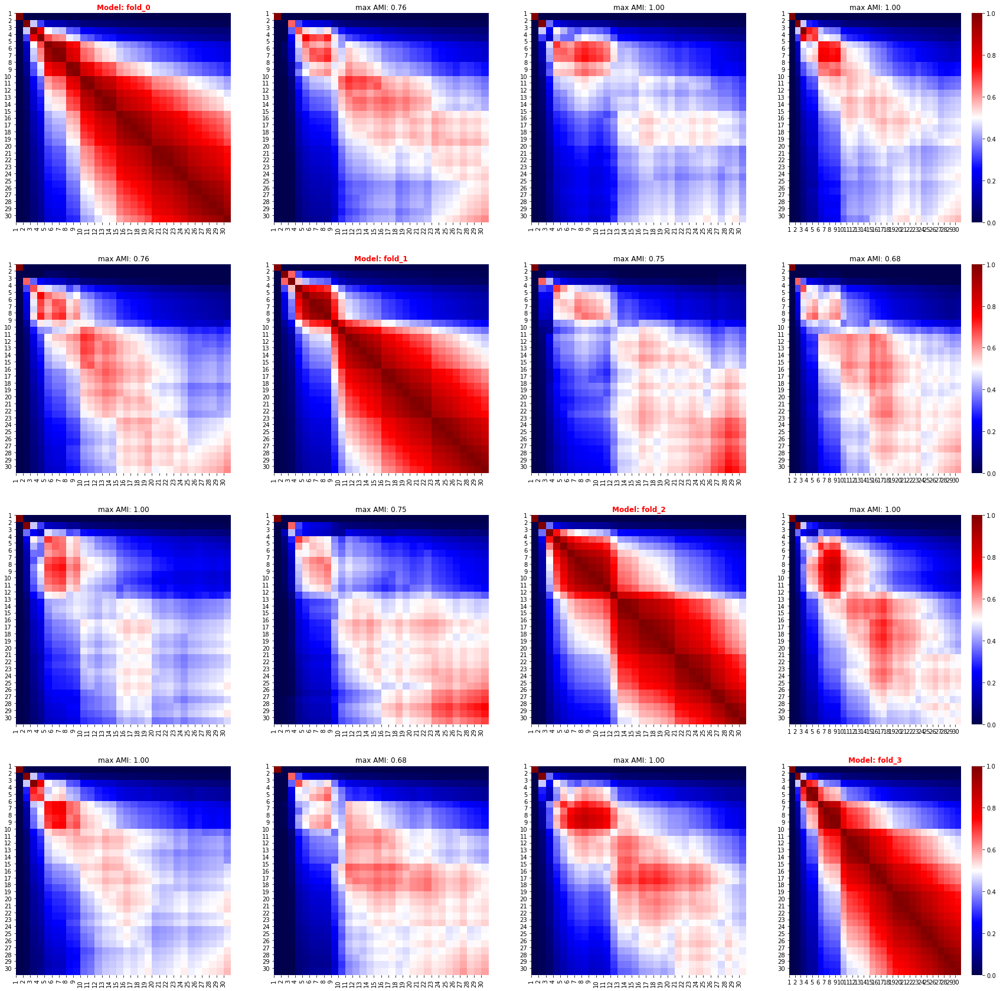

<IPython.core.display.Javascript object>

In [11]:
plot_amis_matrices(names, euc_amis)

#### Cosine-distance based clustering

In [12]:
cosine_amis = []
names = []
for i in tqdm(range(len(fold_latents))):
    names.append("fold_{}".format(i))
    for j in range(len(fold_latents)):
        cosine_amis.append(
            compute_ami_matrix(
                fold_latents[i],
                fold_latents[j],
                affinity="cosine",
                n_max_clusters=30,
            )
        )

100%|██████████| 4/4 [02:19<00:00, 34.76s/it]


<IPython.core.display.Javascript object>

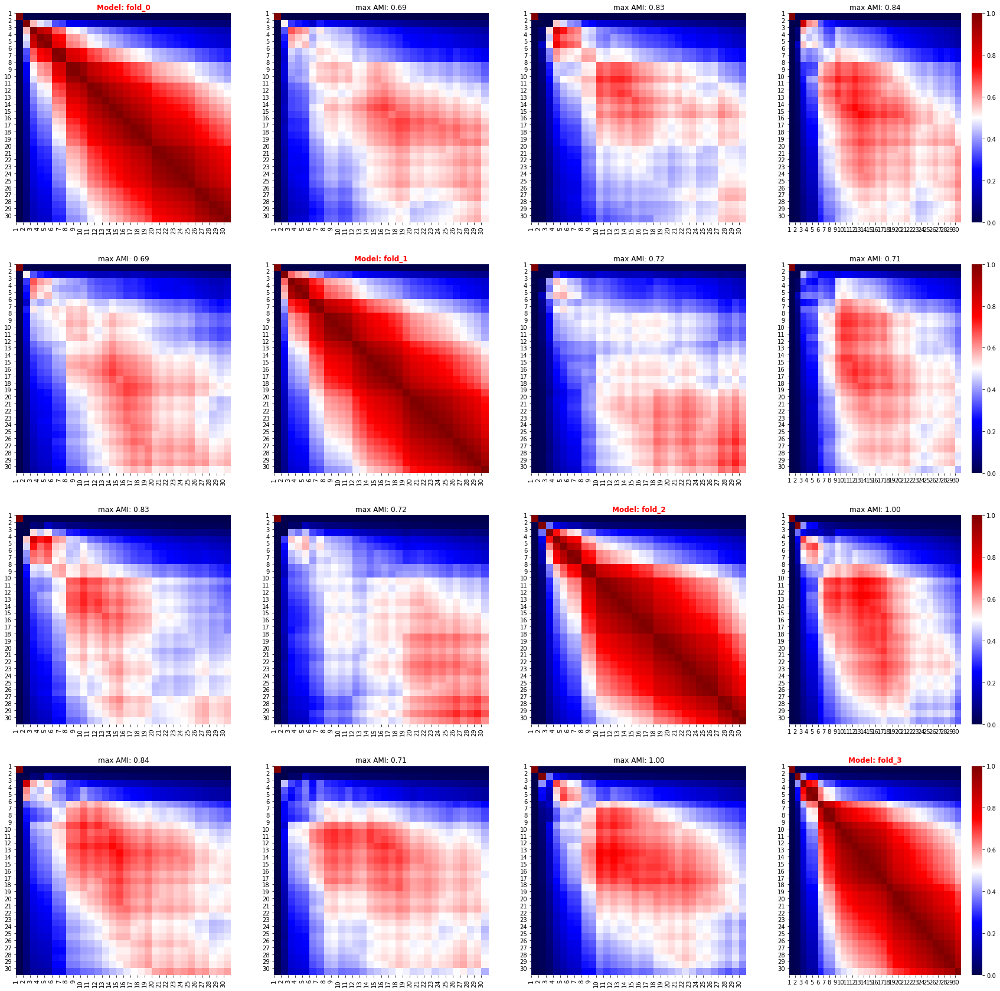

<IPython.core.display.Javascript object>

In [13]:
plot_amis_matrices(names, cosine_amis)

---

### 2.2. Effect on the fold effects for the co-clustering

As shown above while the co-clustering is clearly not random as expected there are some difference of which regulators co-cluster depending on which held-out data set we assess. This is visible in the above heatmaps visualizing the adjusted mutual information for varying number of clusters of the regulator mean embeddings for the individual targets.

We are interested in understanding how those different embeddings co-cluster with the regulatory space that we inferred from scRNA-seq and interactome data. To this end, we load the respective data and once more assess the co-clustering of the different structural embeddings corresponding to the four different held-out fold data sets and the regulatory network embeddings.

In [14]:
node_embs = pd.read_csv("../../../data/ppi/embedding/node_embeddings.csv", index_col=0)
shared_nodes = set(node_embs.index).intersection(fold_latents[0].index)

<IPython.core.display.Javascript object>

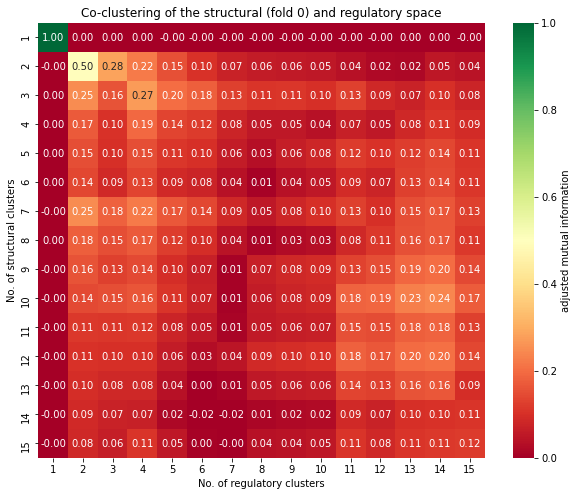

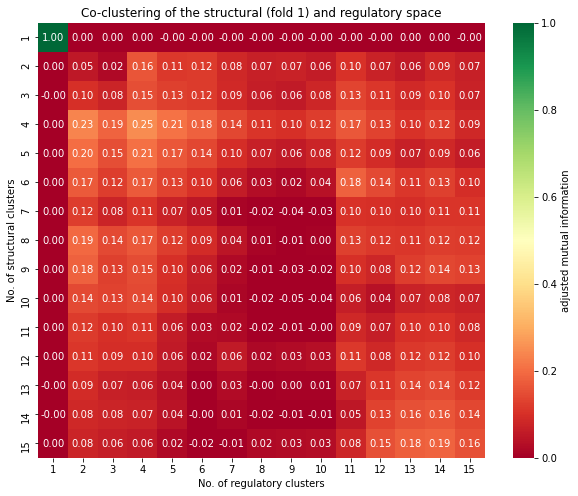

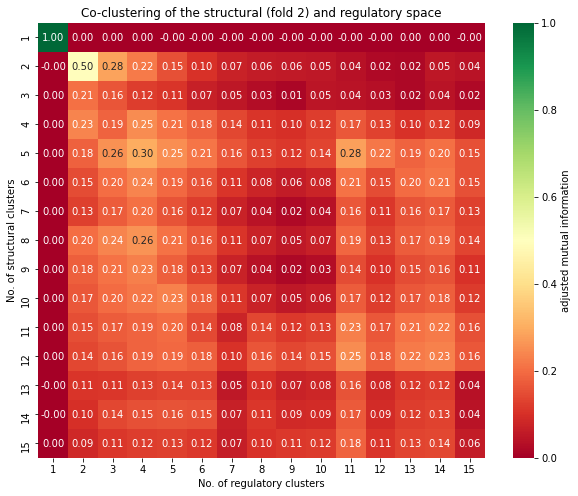

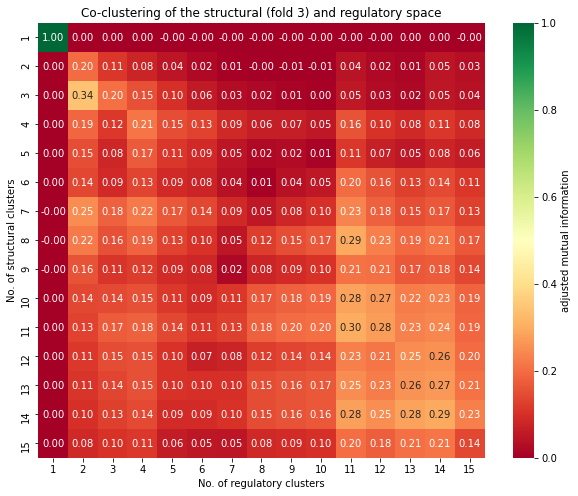

<IPython.core.display.Javascript object>

In [15]:
for i in range(len(fold_latents)):
    ami_fold_node = compute_ami_matrix(
        fold_latents[i].loc[shared_nodes],
        node_embs.loc[shared_nodes],
        affinity=["euclidean", "euclidean"],
        linkage="average",
        n_max_clusters=15,
    )
    fig, ax = plt.subplots(figsize=[10, 8])
    sns.heatmap(
        ami_fold_node,
        cmap="RdYlGn",
        annot=True,
        fmt=".2f",
        ax=ax,
        vmin=0,
        vmax=1,
        cbar_kws={"label": "adjusted mutual information"},
    )
    ax.set_xticklabels([i + 1 for i in range(len(ami_fold_node))])
    ax.set_yticklabels([i + 1 for i in range(len(ami_fold_node))])
    ax.set_xlabel("No. of regulatory clusters")
    ax.set_ylabel("No. of structural clusters")
    ax.set_title(
        "Co-clustering of the structural (fold {}) and regulatory space".format(i)
    )
    plt.show()